<a href="https://colab.research.google.com/github/xphoenixx32/test_query/blob/main/factor_analysis_on_walmart_sales_performance.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **Prepare**

In [ ]:
# !pip install itables
# !pip install pmdarima
# !pip install -U kaleido
# !pip install ace_tools
# !pip install tensorflow
# !pip install scipy
!pip install keras

In [ ]:
print("Keras version:", keras.__version__)
print("TensorFlow version:", tf.__version__)

Keras version: 3.5.0
TensorFlow version: 2.17.1


### **Import Packages**

In [ ]:
# basic
import os
from datetime import timedelta
import pandas as pd
import numpy as np
import random
from datetime import datetime
import pytz

# ploting
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
plt.style.use('ggplot')
from matplotlib.dates import DateFormatter
import matplotlib.cm as cm
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.io as pio
from IPython.display import Image
# from keras.utils.vis_utils import plot_model

# statistics
from scipy.stats import skew, kurtosis, ttest_ind, f_oneway
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import statsmodels.api as sm
import statsmodels.formula.api as smf

# modeling
# import pmdarima as pm
import keras
from keras.saving import save_model
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, ParameterGrid, KFold
from sklearn.metrics import classification_report, confusion_matrix, mean_squared_error, mean_absolute_error, r2_score, make_scorer, silhouette_score, silhouette_samples
from sklearn.inspection import PartialDependenceDisplay
# import ace_tools as tools
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import TensorBoard, EarlyStopping
from tensorflow.keras.utils import plot_model

# others
from tqdm import tqdm
from IPython.core.interactiveshell import InteractiveShell
# from itables import init_notebook_mode
# init_notebook_mode(all_interactive = True)
import warnings
warnings.filterwarnings('ignore')

### **Mount to Drive**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### **Load Dataset**

In [ ]:
# df = pd.read_csv('/content/drive/MyDrive/01 file_share_to_google_colab/walmart_case_study.csv')
df = pd.read_csv('/content/drive/MyDrive/01 file_share_to_google_colab/20241120_walmart_data.csv')

### **Intructions of Dataset**

#### Store
- **Store Number**: Unique identifier for each store.

#### Date
- **Week of Sales**: Date corresponding to the sales weeks

#### Weekly_Sales
- **Sales**: Weekly sales figure for the given store.

#### Holiday_Flag
- **Holiday Indicator**: Indicates whether the week is a holiday week.
  - `1` – Holiday week
  - `0` – Non-holiday week

#### Temperature
- **Temperature**: Average temperature on the day of sale.

#### Fuel_Price
- **Fuel Cost**: Average fuel price in the region during the week.

#### CPI
- **Consumer Price Index (CPI)**: Prevailing CPI for the week.

#### Unemployment
- **Unemployment Rate**: Prevailing unemployment rate in the region.

#### Holiday Events
- **Special Holidays**: Key holiday dates that may impact sales.
  - **Super Bowl**: Feb 12, 2010; Feb 11, 2011; Feb 10, 2012; Feb 8, 2013
  - **Labour Day**: Sep 10, 2010; Sep 9, 2011; Sep 7, 2012; Sep 6, 2013
  - **Thanksgiving**: Nov 26, 2010; Nov 25, 2011; Nov 23, 2012; Nov 29, 2013
  - **Christmas**: Dec 31, 2010; Dec 30, 2011; Dec 28, 2012; Dec 27, 2013

In [ ]:
df.to_pickle('walmart_data_20241124.pkl')

### **Pre-processing Data**

In [ ]:
df['date'] = pd.to_datetime(df['date'])
df['Store_id'] = df['Store'].astype('str')
df = df[['Store_id', 'date', 'Weekly_Sales', 'Holiday_Flag', 'Temperature', 'Fuel_Price', 'CPI', 'Unemployment']]
df.dtypes, df.columns

(Store_id                object
 date            datetime64[ns]
 Weekly_Sales             int64
 Holiday_Flag             int64
 Temperature            float64
 Fuel_Price             float64
 CPI                    float64
 Unemployment           float64
 dtype: object,
 Index(['Store_id', 'date', 'Weekly_Sales', 'Holiday_Flag', 'Temperature',
        'Fuel_Price', 'CPI', 'Unemployment'],
       dtype='object'))

In [ ]:
print(df.groupby('date')['Store_id'].nunique().reset_index().shape)
df.groupby('date')['Store_id'].nunique().reset_index()

(135, 2)


,date,Store_id
0,2010-02-05,45
1,2010-02-12,45
2,2010-02-19,45
3,2010-02-26,45
4,2010-03-05,45
...,...,...
130,2012-08-03,45
131,2012-08-10,45
132,2012-08-17,45
133,2012-08-24,45


In [ ]:
df.groupby(['Season', 'Holiday_Flag'])['Store_id'].count().to_frame('Data Count')

Data Count
Season Holiday_Flag            
Autumn 0                    990
       1                    180
Spring 0                   1755
Summer 0                   1800
Winter 0                   1125
       1                    225

In [ ]:
df.describe([.85, .95, .99])

,date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
count,6075,6.075000e+03,6075.000000,6075.000000,6075.000000,6075.000000,6075.000000
mean,2011-05-20 00:00:00,1.048924e+06,0.066667,60.325129,3.328965,171.292784,8.052699
min,2010-02-05 00:00:00,2.099860e+05,0.000000,-2.060000,2.472000,126.064000,4.077000
50%,2011-05-20 00:00:00,9.611860e+05,0.000000,62.300000,3.389000,182.604292,7.931000
85%,2012-04-13 00:00:00,1.724475e+06,0.000000,81.249000,3.823000,215.453226,9.265000
95%,2012-07-20 00:00:00,2.052468e+06,1.000000,87.809000,4.002000,221.391720,12.187000
99%,2012-08-24 00:00:00,2.428074e+06,1.000000,93.290000,4.193000,225.258385,14.180000
max,2012-08-31 00:00:00,3.818686e+06,1.000000,100.140000,4.308000,226.073413,14.313000
std,NaN,5.668817e+05,0.249464,18.728183,0.452056,39.233754,1.875679


## **EDA**

### **Distribution**

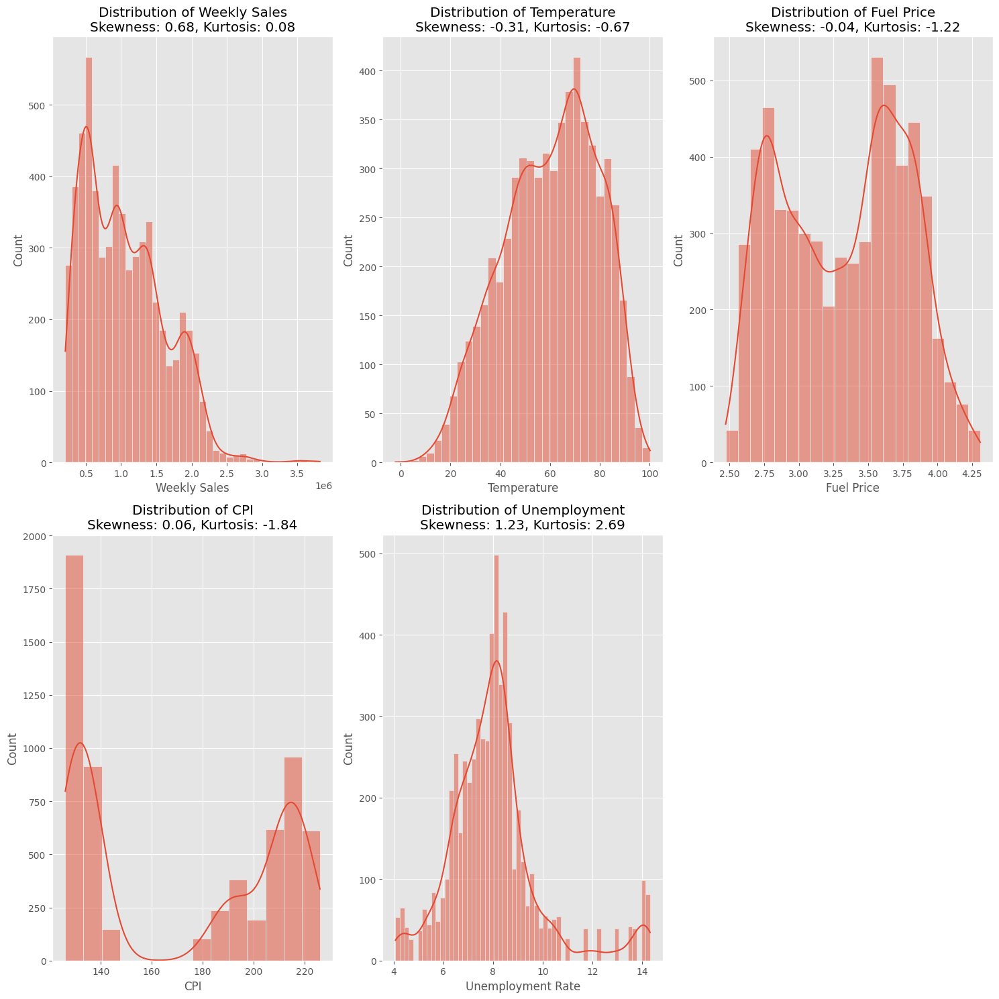

In [ ]:
fig, axes = plt.subplots(2, 3,
                         figsize = (15, 15),)

# Weekly_Sales
skewness = skew(df['Weekly_Sales'].dropna())
kurt = kurtosis(df['Weekly_Sales'].dropna())
sns.histplot(df['Weekly_Sales'],
             kde = True,
             ax = axes[0, 0],
             )
axes[0, 0].set_title(f'Distribution of Weekly Sales\nSkewness: {skewness:.2f}, Kurtosis: {kurt:.2f}')
axes[0, 0].set_xlabel('Weekly Sales')

# Temperature
skewness = skew(df['Temperature'].dropna())
kurt = kurtosis(df['Temperature'].dropna())
sns.histplot(df['Temperature'],
             kde = True,
             ax = axes[0, 1],
             )
axes[0, 1].set_title(f'Distribution of Temperature\nSkewness: {skewness:.2f}, Kurtosis: {kurt:.2f}')
axes[0, 1].set_xlabel('Temperature')

# Fuel_Price
skewness = skew(df['Fuel_Price'].dropna())
kurt = kurtosis(df['Fuel_Price'].dropna())
sns.histplot(df['Fuel_Price'],
             kde = True,
             ax = axes[0, 2],
             )
axes[0, 2].set_title(f'Distribution of Fuel Price\nSkewness: {skewness:.2f}, Kurtosis: {kurt:.2f}')
axes[0, 2].set_xlabel('Fuel Price')

# CPI
skewness = skew(df['CPI'].dropna())
kurt = kurtosis(df['CPI'].dropna())
sns.histplot(df['CPI'],
             kde = True,
             ax = axes[1, 0],
             )
axes[1, 0].set_title(f'Distribution of CPI\nSkewness: {skewness:.2f}, Kurtosis: {kurt:.2f}')
axes[1, 0].set_xlabel('CPI')

# Unemployment
skewness = skew(df['Unemployment'].dropna())
kurt = kurtosis(df['Unemployment'].dropna())
sns.histplot(df['Unemployment'],
             kde = True,
             ax = axes[1, 1],
             )
axes[1, 1].set_title(f'Distribution of Unemployment\nSkewness: {skewness:.2f}, Kurtosis: {kurt:.2f}')
axes[1, 1].set_xlabel('Unemployment Rate')

# Remove unused subplot (last one)
axes[1, 2].axis('off')

plt.tight_layout()
plt.show()

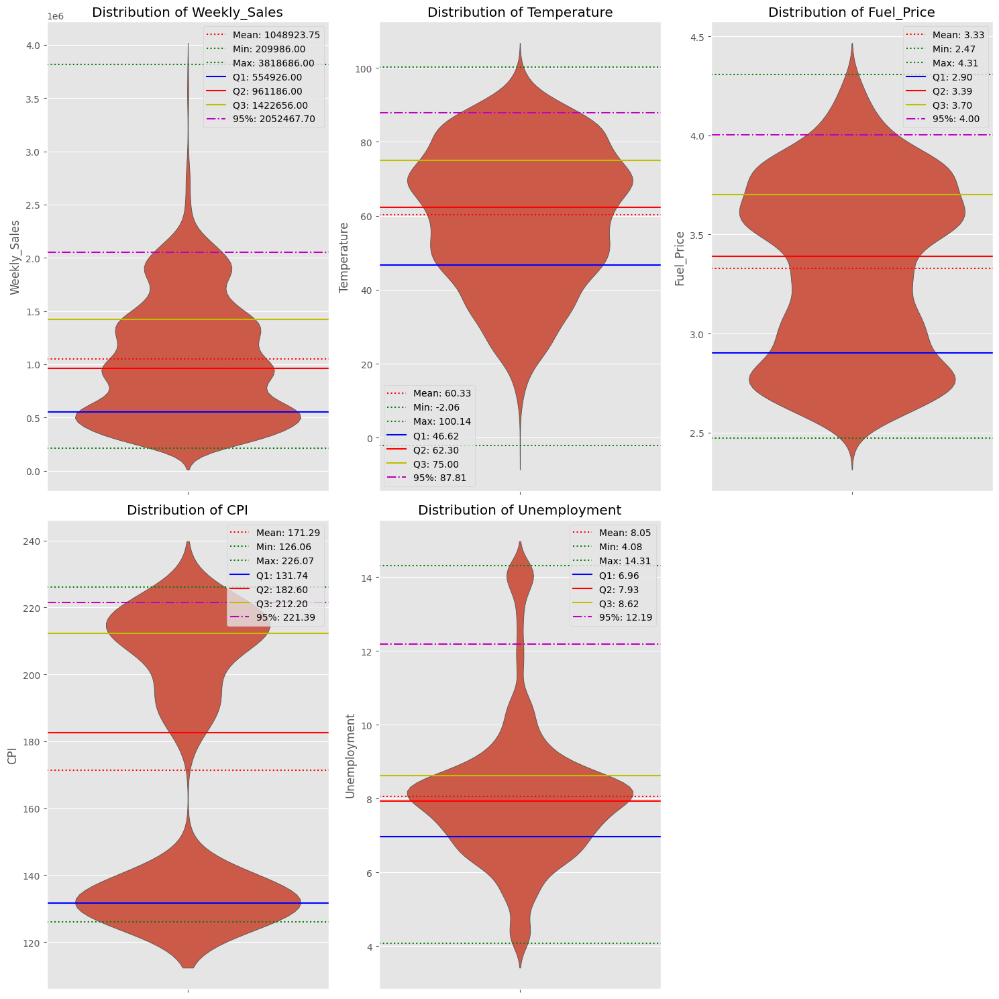

In [ ]:
fig, axes = plt.subplots(2, 3,
                         figsize = (15, 15),
                         )

columns = ['Weekly_Sales', 'Temperature', 'Fuel_Price', 'CPI', 'Unemployment']

for i, column in enumerate(columns):
    row, col = divmod(i, 3)
    sns.violinplot(y = df[column],
                   ax = axes[row, col],
                   inner = None)

    mean_val = df[column].mean()
    std_val = df[column].std()
    min_val = df[column].min()
    max_val = df[column].max()
    q25 = df[column].quantile(0.25)
    q50 = df[column].quantile(0.5)
    q75 = df[column].quantile(0.75)
    q95 = df[column].quantile(0.95)

    axes[row, col].axhline(mean_val, color = 'r', linestyle = ':', label = f'Mean: {mean_val:.2f}')
    axes[row, col].axhline(min_val, color = 'g', linestyle = ':', label = f'Min: {min_val:.2f}')
    axes[row, col].axhline(max_val, color = 'g', linestyle = ':', label = f'Max: {max_val:.2f}')
    axes[row, col].axhline(q25, color = 'b', linestyle = '-', label = f'Q1: {q25:.2f}')
    axes[row, col].axhline(q50, color = 'r', linestyle = '-', label = f'Q2: {q50:.2f}')
    axes[row, col].axhline(q75, color = 'y', linestyle = '-', label = f'Q3: {q75:.2f}')
    axes[row, col].axhline(q95, color = 'm', linestyle = '-.', label = f'95%: {q95:.2f}')

    axes[row, col].set_title(f'Distribution of {column}')
    axes[row, col].legend()

axes[1, 2].axis('off')

plt.tight_layout()
plt.show()

### **Cross-Relation Scatter**

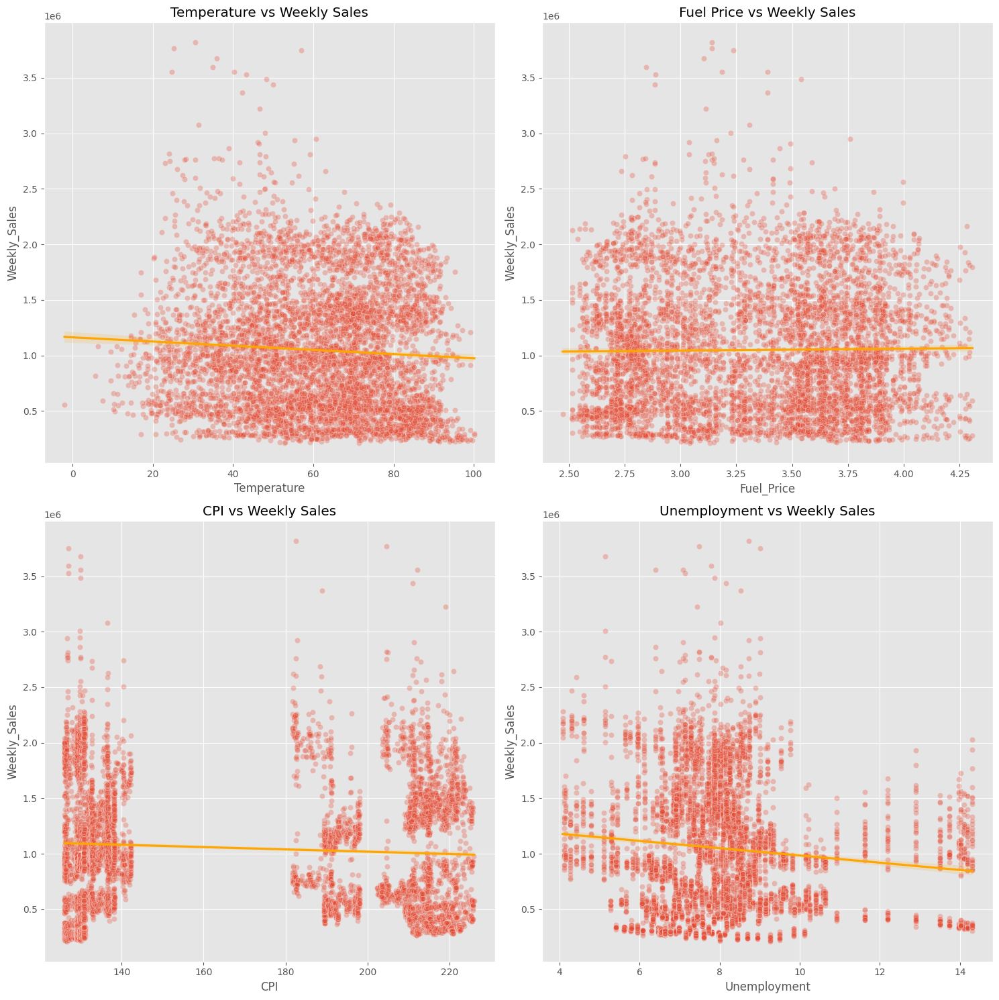

CPU times: user 3.1 s, sys: 175 ms, total: 3.27 s
Wall time: 3.18 s


In [ ]:
%%time
fig, axes = plt.subplots(2, 2,
                         figsize = (15, 15),
                        )

# Temperature vs Weekly_Sales
sns.scatterplot(data = df,
                x = 'Temperature',
                y = 'Weekly_Sales',
                ax = axes[0, 0],
                alpha = 0.3,
               )
sns.regplot(data = df,
            x = 'Temperature',
            y = 'Weekly_Sales',
            ax = axes[0, 0],
            scatter = False,
            color = 'orange',
            )
axes[0, 0].set_title('Temperature vs Weekly Sales')

# Fuel Price vs Weekly_Sales
sns.scatterplot(data = df,
                x = 'Fuel_Price',
                y = 'Weekly_Sales',
                ax = axes[0, 1],
                alpha = 0.3,
               )
sns.regplot(data = df,
            x = 'Fuel_Price',
            y = 'Weekly_Sales',
            ax = axes[0, 1],
            scatter = False,
            color = 'orange',
            )
axes[0, 1].set_title('Fuel Price vs Weekly Sales')

# CPI vs Weekly_Sales
sns.scatterplot(data = df,
                x = 'CPI',
                y = 'Weekly_Sales',
                ax = axes[1, 0],
                alpha = 0.3,
               )
sns.regplot(data = df,
            x = 'CPI',
            y = 'Weekly_Sales',
            ax = axes[1, 0],
            scatter = False,
            color = 'orange',
            )
axes[1, 0].set_title('CPI vs Weekly Sales')

# Unemployment vs Weekly_Sales
sns.scatterplot(data = df,
                x = 'Unemployment',
                y = 'Weekly_Sales',
                ax = axes[1, 1],
                alpha = 0.3,
               )
sns.regplot(data = df,
            x = 'Unemployment',
            y = 'Weekly_Sales',
            ax = axes[1, 1],
            scatter = False,
            color = 'orange',
            )
axes[1, 1].set_title('Unemployment vs Weekly Sales')

plt.tight_layout()
plt.show()

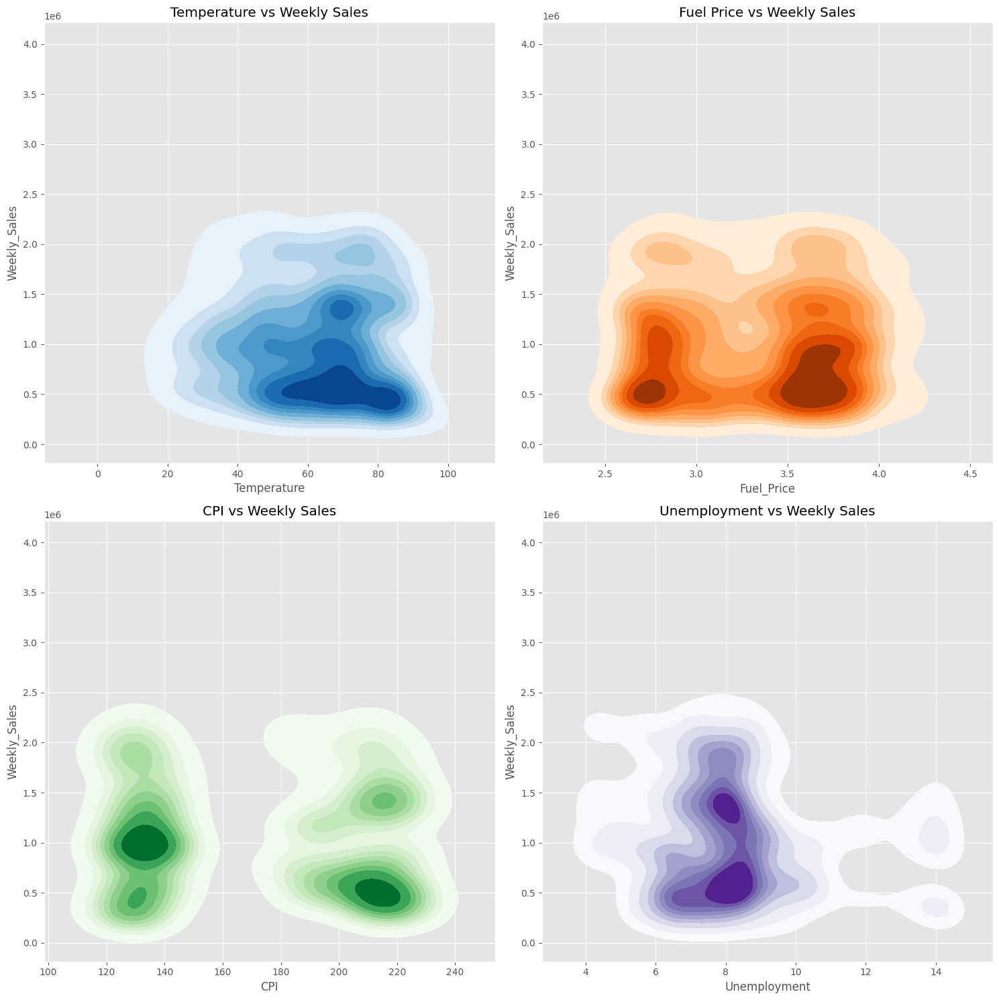

In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(15, 15))

# # Temperature vs Weekly_Sales
sns.kdeplot(data = df,
            x = 'Temperature',
            y = 'Weekly_Sales',
            ax = axes[0, 0],
            cmap = 'Blues',
            fill = True,
            thresh = 0.05,
            )
axes[0, 0].set_title('Temperature vs Weekly Sales')

# # Fuel Price vs Weekly_Sales
sns.kdeplot(data = df,
            x = 'Fuel_Price',
            y = 'Weekly_Sales',
            ax = axes[0, 1],
            cmap = 'Oranges',
            fill = True,
            thresh = 0.05,
            )
axes[0, 1].set_title('Fuel Price vs Weekly Sales')

# # CPI vs Weekly_Sales
sns.kdeplot(data = df,
            x = 'CPI',
            y = 'Weekly_Sales',
            ax = axes[1, 0],
            cmap = 'Greens',
            fill = True,
            thresh = 0.05,
            )
axes[1, 0].set_title('CPI vs Weekly Sales')

# # Unemployment vs Weekly_Sales
sns.kdeplot(data = df,
            x = 'Unemployment',
            y = 'Weekly_Sales',
            ax = axes[1, 1],
            cmap = 'Purples',
            fill = True,
            thresh = 0.05,
            )
axes[1, 1].set_title('Unemployment vs Weekly Sales')


plt.tight_layout()
plt.show()

## **Testify Categorical VAR on Sales**

### **1. Holiday_Flag**

T-statistic: 2.62
p-value: 0.0091




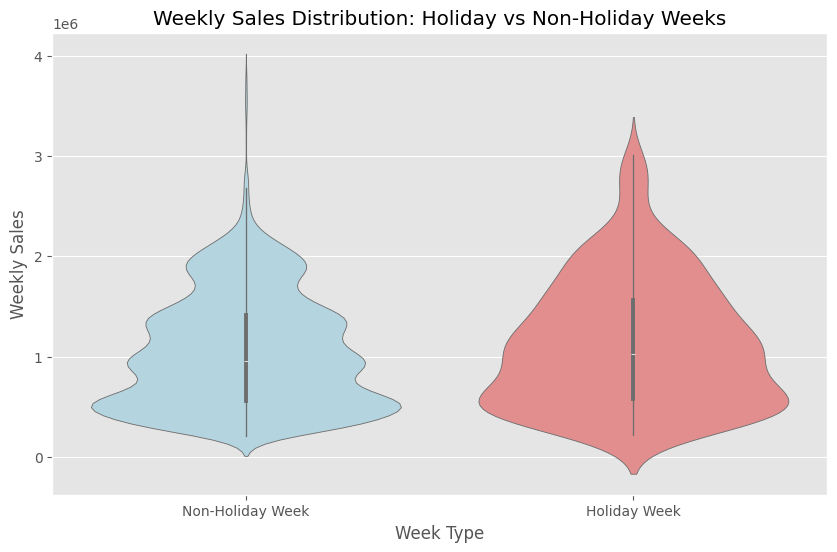

CPU times: user 440 ms, sys: 62 ms, total: 502 ms
Wall time: 354 ms


In [ ]:
%%time
# Separate sales data into holiday and non-holiday weeks
holiday_sales = df[df['Holiday_Flag'] == 1]['Weekly_Sales']
non_holiday_sales = df[df['Holiday_Flag'] == 0]['Weekly_Sales']

# Perform t-test to check for significant difference in sales between holiday and non-holiday weeks
t_stat, p_value = ttest_ind(holiday_sales,
                            non_holiday_sales,
                            equal_var = False,
                            )

print(f"T-statistic: {t_stat:.2f}")
print(f"p-value: {p_value:.4f}")
print('\n')

plt.style.use('ggplot')
plt.figure(figsize = (10, 6))
sns.violinplot(data = df,
               x = 'Holiday_Flag',
               y = 'Weekly_Sales',
               palette = ['lightblue','lightcoral'],
               dodge = False,
              )
plt.xticks([0, 1], ['Non-Holiday Week', 'Holiday Week'])
plt.title("Weekly Sales Distribution: Holiday vs Non-Holiday Weeks")
plt.xlabel("Week Type")
plt.ylabel("Weekly Sales")
plt.show()

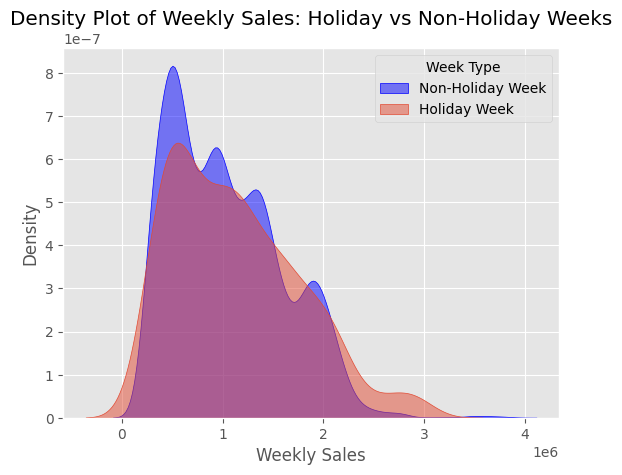

In [ ]:
sns.kdeplot(data = df[df['Holiday_Flag'] == 0],
            x = 'Weekly_Sales',
            fill = True,
            color = 'blue',
            alpha = 0.5,
            label = 'Non-Holiday Week',
            )
sns.kdeplot(data = df[df['Holiday_Flag'] == 1],
            x = 'Weekly_Sales',
            fill = True,
            # color = 'blue',
            alpha = 0.5,
            label = 'Holiday Week',
            )

plt.title("Density Plot of Weekly Sales: Holiday vs Non-Holiday Weeks")
plt.xlabel("Weekly Sales")
plt.ylabel("Density")
plt.legend(title = 'Week Type')
plt.show()

In [ ]:
df.groupby('Holiday_Flag')['Weekly_Sales'].median().to_frame().reset_index()

,Holiday_Flag,Weekly_Sales
0,0,956220.0
1,1,1021392.0


### **2. Season**

In [ ]:
def get_season(date):
    month = date.month
    if month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    elif month in [9, 10, 11]:
        return 'Autumn'
    else:
        return 'Winter'

In [ ]:
df['Season'] = df['date'].apply(get_season)

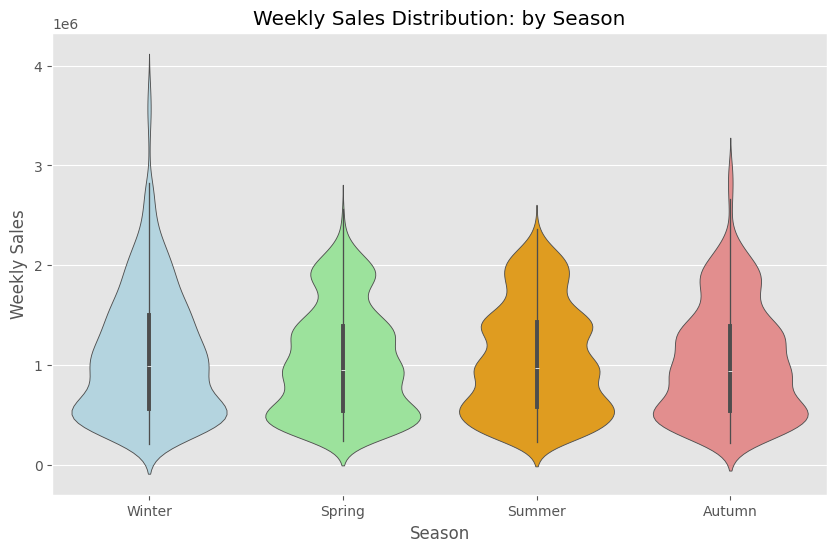

In [ ]:
plt.figure(figsize = (10, 6))
sns.violinplot(data = df,
               x = 'Season',
               y = 'Weekly_Sales',
               palette = ['lightblue','lightgreen','orange','lightcoral'],
              )
# plt.xticks([0, 1, 2, 3], ["Spring", "Summer", "Fall", "Winter"])
plt.title("Weekly Sales Distribution: by Season")
plt.xlabel("Season")
plt.ylabel("Weekly Sales")
plt.show()

In [ ]:
anova_data = [df[df['Season'] == season]['Weekly_Sales'] for season in df['Season'].unique()]
f_stat, p_value = f_oneway(*anova_data)
tukey_result = pairwise_tukeyhsd(endog = df['Weekly_Sales'],
                                 groups = df['Season'],
                                 alpha = 0.05,
                                )
print(f"F-statistic: {f_stat:.2f}")
print(f"p-value: {p_value:.4f}")
print('='*60)
print('\n')
print(tukey_result)

F-statistic: 4.34
p-value: 0.0046


      Multiple Comparison of Means - Tukey HSD, FWER=0.05      
group1 group2   meandiff  p-adj     lower       upper    reject
---------------------------------------------------------------
Autumn Spring -11715.3627 0.9471 -66651.1655  43220.4401  False
Autumn Summer  12106.1791 0.9413 -42554.2545  66766.6128  False
Autumn Winter  59420.3725 0.0429   1281.7836 117558.9614   True
Spring Summer  23821.5418 0.5926 -25006.4677  72649.5514  False
Spring Winter  71135.7352  0.003  18443.1642 123828.3061   True
Summer Winter  47314.1933 0.0936  -5091.2225  99719.6092  False
---------------------------------------------------------------


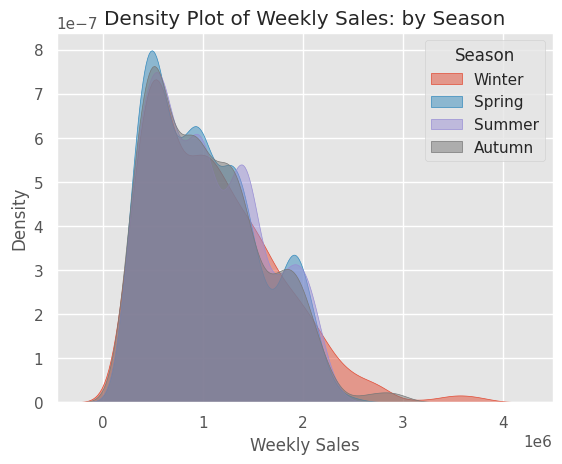

In [ ]:
for i in df['Season'].unique():
    sns.kdeplot(data = df[df['Season'] == i],
                x = 'Weekly_Sales',
                fill = True,
                alpha = 0.5,
                label = i,
                )

plt.title("Density Plot of Weekly Sales: by Season")
plt.xlabel("Weekly Sales")
plt.ylabel("Density")
plt.legend(title = 'Season')
plt.show()

### **3. Week Sequence**

In [ ]:
df['Week_of_Month'] = df['date'].apply(lambda x: (x.day - 1) // 7 + 1)
df.groupby(['Week_of_Month'])['Store_id'].count().to_frame('Data_Rows_Count').reset_index()

,Week_of_Month,Data_Rows_Count
0,1,1395
1,2,1395
2,3,1395
3,4,1395
4,5,495


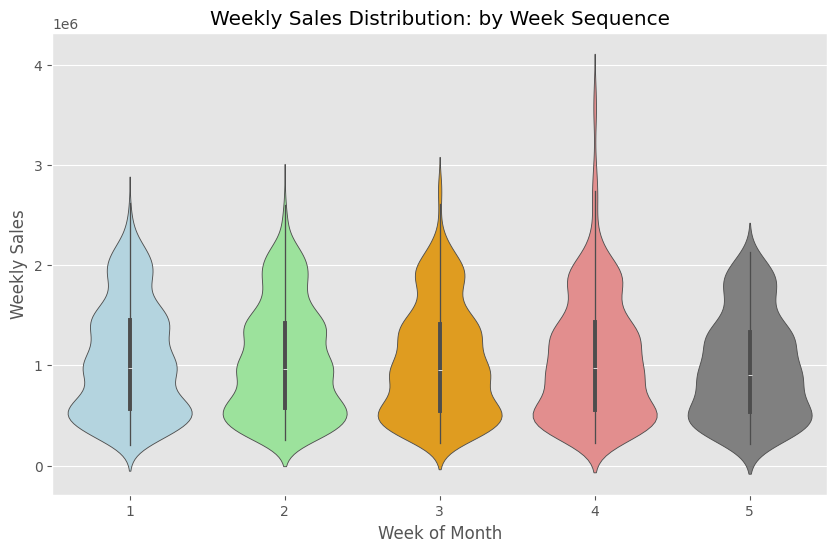

In [ ]:
plt.figure(figsize = (10, 6))
sns.violinplot(data = df,
               x = 'Week_of_Month',
               y = 'Weekly_Sales',
               palette = ['lightblue','lightgreen','orange','lightcoral','grey'],
              )
plt.title("Weekly Sales Distribution: by Week Sequence")
plt.xlabel("Week of Month")
plt.ylabel("Weekly Sales")
plt.show()

In [ ]:
anova_data = [df[df['Week_of_Month'] == weeks]['Weekly_Sales'] for weeks in df['Week_of_Month'].unique()]
f_stat, p_value = f_oneway(*anova_data)
tukey_result = pairwise_tukeyhsd(endog = df['Weekly_Sales'],
                                 groups = df['Week_of_Month'],
                                 alpha = 0.05,
                                )

print(f"F-statistic: {f_stat:.2f}")
print(f"p-value: {p_value:.4f}")
print('='*60)
print('\n')
print(tukey_result)

F-statistic: 2.67
p-value: 0.0306


      Multiple Comparison of Means - Tukey HSD, FWER=0.05       
group1 group2   meandiff  p-adj     lower        upper    reject
----------------------------------------------------------------
     1      2 -11428.9226  0.984  -69964.6508  47106.8057  False
     1      3 -17855.6172 0.9206  -76391.3455  40680.1111  False
     1      4  19462.2523 0.8942  -39073.4759  77997.9806  False
     1      5 -73640.0326 0.0943  -154518.764   7238.6988  False
     2      3  -6426.6946 0.9982  -64962.4229  52109.0336  False
     2      4  30891.1749 0.6017  -27644.5534  89426.9032  False
     2      5   -62211.11 0.2206 -143089.8414  18667.6214  False
     3      4  37317.8695 0.4097  -21217.8587  95853.5978  False
     3      5 -55784.4154 0.3271 -136663.1468   25094.316  False
     4      5 -93102.2849 0.0146 -173981.0163 -12223.5535   True
----------------------------------------------------------------


### **4. Year**

In [ ]:
df['Year'] = df['date'].apply(lambda x: x.year)

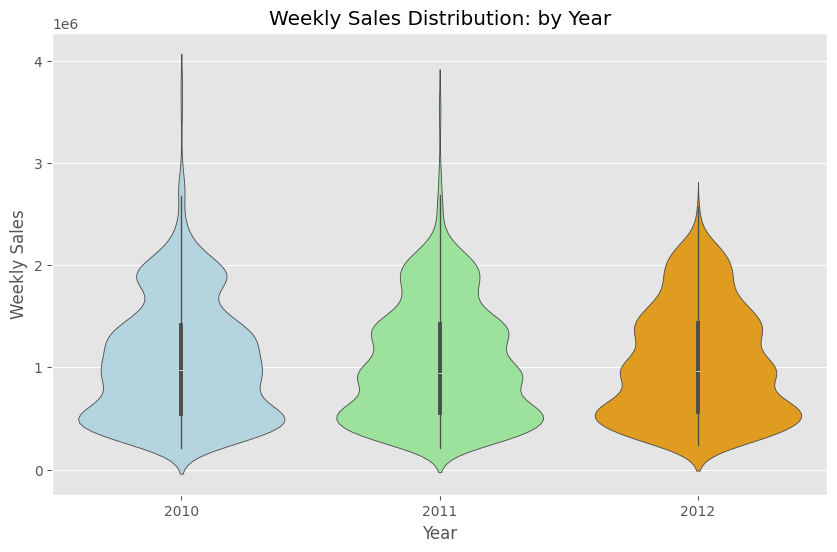

In [ ]:
plt.figure(figsize = (10, 6))
sns.violinplot(data = df,
               x = 'Year',
               y = 'Weekly_Sales',
               palette = ['lightblue','lightgreen','orange'],
              )
plt.title("Weekly Sales Distribution: by Year")
plt.xlabel("Year")
plt.ylabel("Weekly Sales")
plt.show()

In [ ]:
anova_data = [df[df['Year'] == years]['Weekly_Sales'] for years in df['Year'].unique()]
f_stat, p_value = f_oneway(*anova_data)
tukey_result = pairwise_tukeyhsd(endog = df['Weekly_Sales'],
                                 groups = df['Year'],
                                 alpha = 0.05,
                                )

print(f"F-statistic: {f_stat:.2f}")
print(f"p-value: {p_value:.4f}")
print('='*60)
print('\n')
print(tukey_result)

F-statistic: 0.70
p-value: 0.4979


     Multiple Comparison of Means - Tukey HSD, FWER=0.05      
group1 group2   meandiff  p-adj     lower      upper    reject
--------------------------------------------------------------
  2010   2011 -13430.1803 0.7068 -53084.8547 26224.4942  False
  2010   2012 -21494.4983 0.4868  -65529.811 22540.8144  False
  2011   2012   -8064.318 0.9003 -51379.5467 35250.9107  False
--------------------------------------------------------------


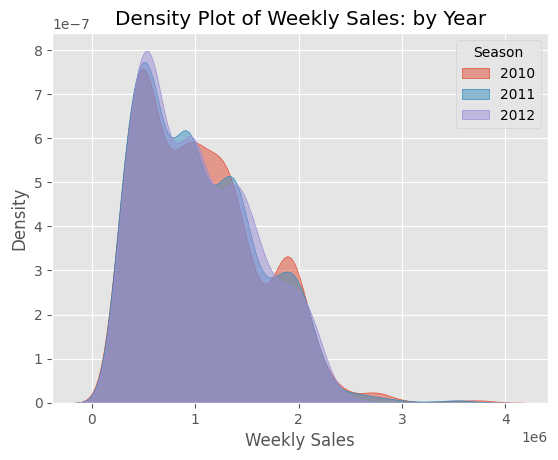

In [ ]:
for i in df['Year'].unique():
    sns.kdeplot(data = df[df['Year'] == i],
                x = 'Weekly_Sales',
                fill = True,
                alpha = 0.5,
                label = i,
                )

plt.title("Density Plot of Weekly Sales: by Year")
plt.xlabel("Weekly Sales")
plt.ylabel("Density")
plt.legend(title = 'Season')
plt.show()

## **Testify Quantitative VAR on Sales**
### **Random Forrest Regressor**
- Ensure the importance value of Factors which can better distinguish the high/low of 'Weekly_Sales'

#### **Preliminary Try (Only Quan)**

In [ ]:
df.columns

Index(['Store_id', 'date', 'Weekly_Sales', 'Holiday_Flag', 'Temperature',
       'Fuel_Price', 'CPI', 'Unemployment', 'Season', 'Week_of_Month', 'Year'],
      dtype='object')

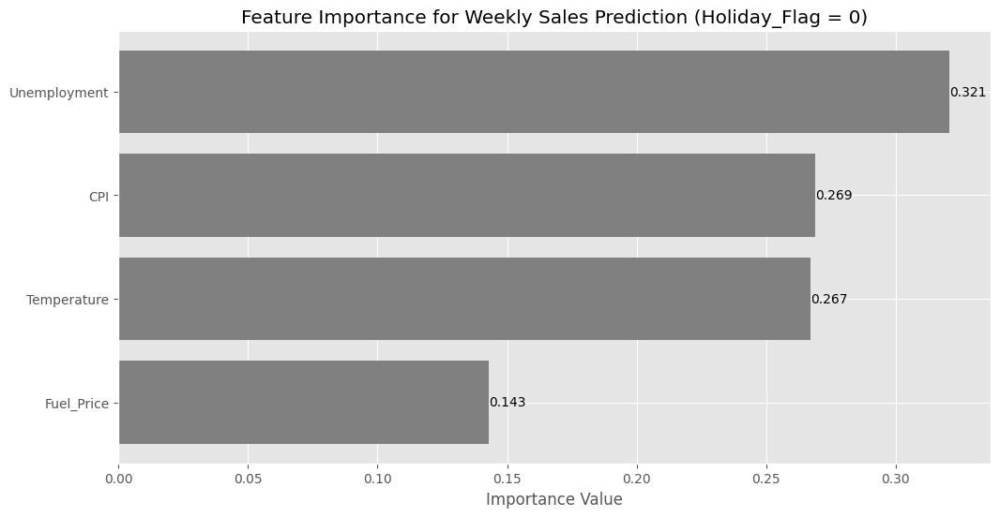

                                                 0
Mean Squared Error                270722310177.714
Mean Absolute Error                     367965.827
R-squared (Test Set)                         0.113
Cross-Validated R-squared (Mean)             0.086
----------------------------------------------------------------------------------------------------


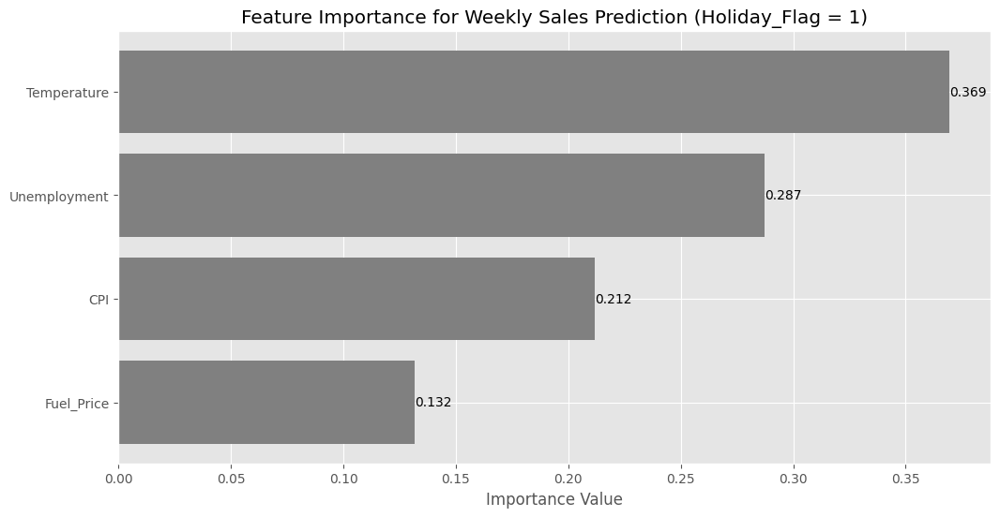

                                                 0
Mean Squared Error                474495790827.615
Mean Absolute Error                     567461.890
R-squared (Test Set)                        -0.293
Cross-Validated R-squared (Mean)            -0.186
----------------------------------------------------------------------------------------------------
CPU times: user 16.6 s, sys: 259 ms, total: 16.8 s
Wall time: 17.2 s


In [ ]:
%%time
# Prepare the data for Random Forest model
features = ['Temperature', 'Fuel_Price', 'CPI', 'Unemployment']

for i in df['Holiday_Flag'].unique():
    X = df.loc[df['Holiday_Flag'] == i][features]
    y = df.loc[df['Holiday_Flag'] == i]['Weekly_Sales']

    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size = 0.2,
                                                        random_state = 0,
                                                        )

    # Initialize and fit the Random Forest Regressor
    rf_model = RandomForestRegressor(n_estimators = 100,
                                     random_state = 0,
                                    )
    rf_model.fit(X_train, y_train)

    # Get feature importances
    feature_importances = pd.DataFrame({
        'Feature': X.columns,
        'Importance': rf_model.feature_importances_
    }).sort_values(by = 'Importance', ascending = False)

    plt.figure(figsize = (12, 6))
    plt.barh(feature_importances['Feature'],
            feature_importances['Importance'],
            color = 'grey',
            )
    plt.xlabel('Importance Value')
    plt.title(f'Feature Importance for Weekly Sales Prediction (Holiday_Flag = {i})')

    # Adding annotations for each bar
    for index, value in enumerate(feature_importances['Importance']):
        plt.text(value,
                index,
                f'{value:.3f}',
                va = 'center',
                )

    plt.gca().invert_yaxis()  # Invert y-axis to have the most important features at the top
    plt.show()

    # Making predictions on the test set
    y_pred = rf_model.predict(X_test)

    # Calculating evaluation metrics
    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    # Cross-validation (using 5-fold cross-validation)
    cv_scores = cross_val_score(rf_model,
                                X,
                                y,
                                cv = 5,
                                scoring = 'r2',
                                )
    cv_r2_mean = np.mean(cv_scores)

    # Display baseline evaluation metrics
    baseline_metrics = {
        'Mean Squared Error': f'{mse:.3f}',
        'Mean Absolute Error': f'{mae:.3f}',
        'R-squared (Test Set)': f'{r2:.3f}',
        'Cross-Validated R-squared (Mean)': f'{cv_r2_mean:.3f}'
    }
    baseline_metrics = pd.DataFrame([baseline_metrics])
    print(baseline_metrics.T)
    print('-'*100)

#### **Secondary Try (Add Ordinary VAR)**

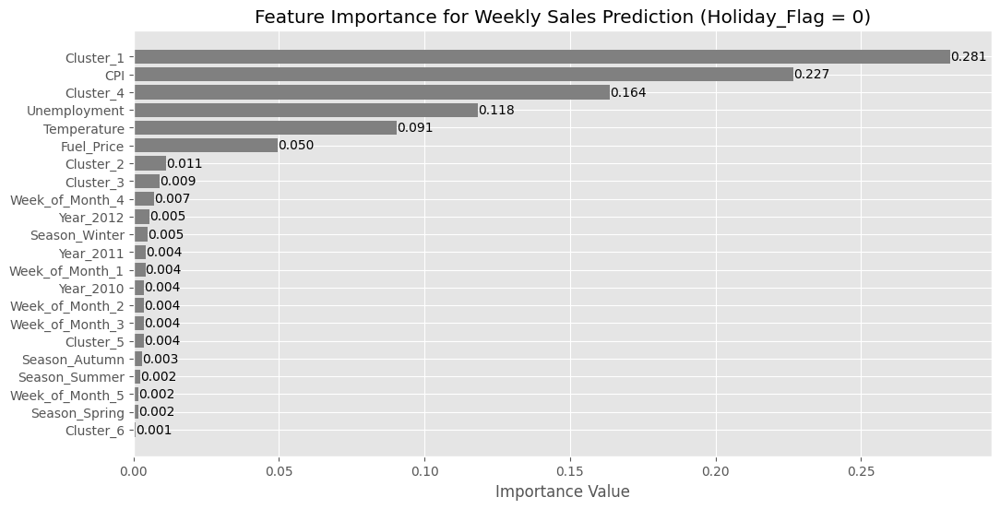

                                                 0
Mean Squared Error                111003410724.794
Mean Absolute Error                     197595.283
R-squared (Test Set)                         0.636
Cross-Validated R-squared (Mean)             0.595
----------------------------------------------------------------------------------------------------


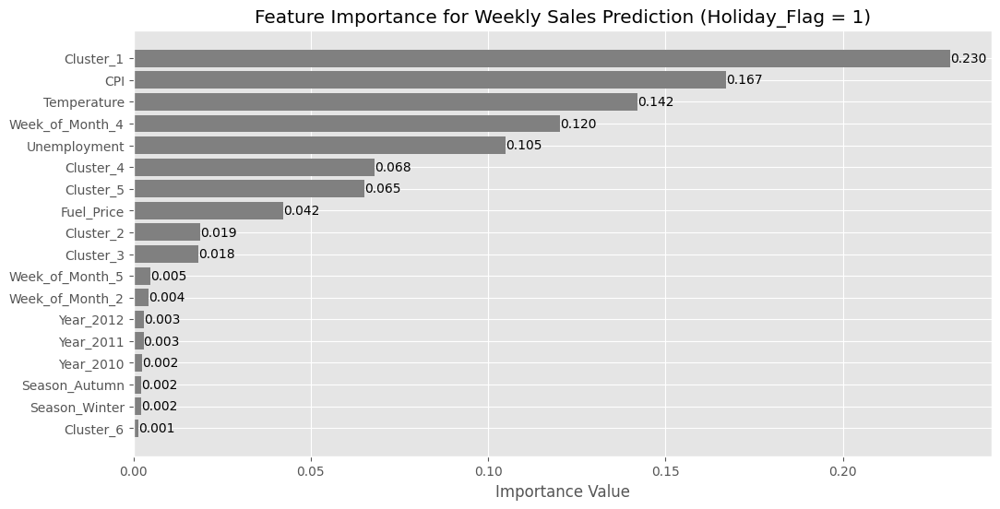

                                                 0
Mean Squared Error                220921374656.342
Mean Absolute Error                     347144.923
R-squared (Test Set)                         0.398
Cross-Validated R-squared (Mean)             0.559
----------------------------------------------------------------------------------------------------
CPU times: user 23.7 s, sys: 339 ms, total: 24.1 s
Wall time: 28.7 s


In [ ]:
%%time
# Prepare the data for Random Forest model
features = ['Temperature', 'Fuel_Price', 'CPI', 'Unemployment', 'Cluster', 'Season', 'Week_of_Month', 'Year']

for i in df['Holiday_Flag'].unique():
    X = pd.get_dummies(df.loc[df['Holiday_Flag'] == i][features], columns = ['Cluster', 'Season', 'Week_of_Month', 'Year'])
    y = df.loc[df['Holiday_Flag'] == i]['Weekly_Sales']

    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size = 0.2,
                                                        random_state = 0,
                                                        )

    # Initialize and fit the Random Forest Regressor
    rf_model = RandomForestRegressor(n_estimators = 100,
                                     random_state = 0,
                                    )
    rf_model.fit(X_train, y_train)

    # Get feature importances
    feature_importances = pd.DataFrame({
        'Feature': X.columns,
        'Importance': rf_model.feature_importances_
    }).sort_values(by = 'Importance', ascending = False)

    plt.figure(figsize = (12, 6))
    plt.barh(feature_importances['Feature'],
            feature_importances['Importance'],
            color = 'grey',
            )
    plt.xlabel('Importance Value')
    plt.title(f'Feature Importance for Weekly Sales Prediction (Holiday_Flag = {i})')

    # Adding annotations for each bar
    for index, value in enumerate(feature_importances['Importance']):
        plt.text(value,
                index,
                f'{value:.3f}',
                va = 'center',
                )

    plt.gca().invert_yaxis()  # Invert y-axis to have the most important features at the top
    plt.show()

    # Making predictions on the test set
    y_pred = rf_model.predict(X_test)

    # Calculating evaluation metrics
    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    # Cross-validation (using 5-fold cross-validation)
    cv_scores = cross_val_score(rf_model,
                                X,
                                y,
                                cv = 5,
                                scoring = 'r2',
                                )
    cv_r2_mean = np.mean(cv_scores)

    # Display baseline evaluation metrics
    baseline_metrics = {
        'Mean Squared Error': f'{mse:.3f}',
        'Mean Absolute Error': f'{mae:.3f}',
        'R-squared (Test Set)': f'{r2:.3f}',
        'Cross-Validated R-squared (Mean)': f'{cv_r2_mean:.3f}'
    }
    baseline_metrics = pd.DataFrame([baseline_metrics])
    print(baseline_metrics.T)
    print('-'*100)

#### **Tuning the HyperParameters**

In [ ]:
%%time

param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Initialize GridSearchCV with the RandomForestRegressor
grid_search = GridSearchCV(estimator = RandomForestRegressor(random_state = 0),
                           param_grid = param_grid,
                           cv = 3,
                           scoring = 'r2',
                           n_jobs = -1,
                           verbose = 1,
                          )

for i in df['Holiday_Flag'].unique():
    X = pd.get_dummies(df.loc[df['Holiday_Flag'] == i][features], columns = ['Cluster', 'Season', 'Week_of_Month', 'Year'])
    y = df.loc[df['Holiday_Flag'] == i]['Weekly_Sales']

    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size = 0.2,
                                                        random_state = 0,
                                                        )

    # Fit GridSearchCV to find the best parameters
    grid_search.fit(X_train, y_train)

    # Get the best parameters and best score from GridSearchCV
    best_params = grid_search.best_params_
    best_score = grid_search.best_score_

    print(f'GridSearchCV Results on Weekly Sales Prediction (Holiday_Flag = {i})')
    print('best_params: ', best_params)
    print('best_score: ', best_score)
    print('-'*100)
    print('\n')

Fitting 3 folds for each of 108 candidates, totalling 324 fits
GridSearchCV Results on Weekly Sales Prediction (Holiday_Flag = 0)
best_params:  {'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 200}
best_score:  0.689474813009309
----------------------------------------------------------------------------------------------------


Fitting 3 folds for each of 108 candidates, totalling 324 fits
GridSearchCV Results on Weekly Sales Prediction (Holiday_Flag = 1)
best_params:  {'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 100}
best_score:  0.4794559782033092
----------------------------------------------------------------------------------------------------


CPU times: user 11.3 s, sys: 1.19 s, total: 12.5 s
Wall time: 9min 46s


#### **Final Outcome**

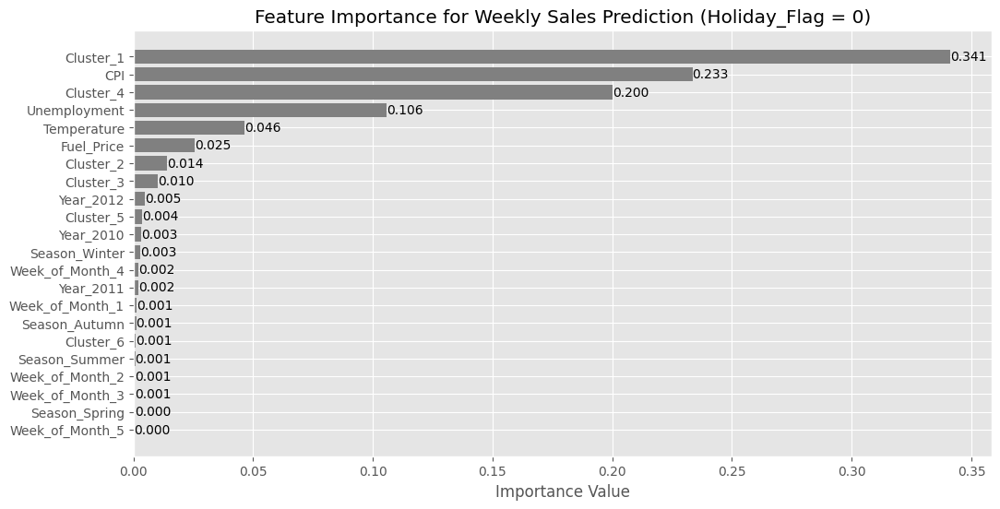

                                                0
Mean Squared Error                78275192966.847
Mean Absolute Error                    185532.881
R-squared (Test Set)                        0.744
Cross-Validated R-squared (Mean)            0.605


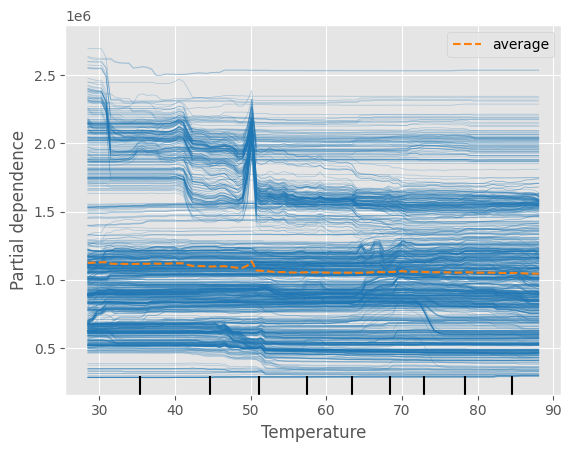

<Figure size 3000x1200 with 0 Axes>

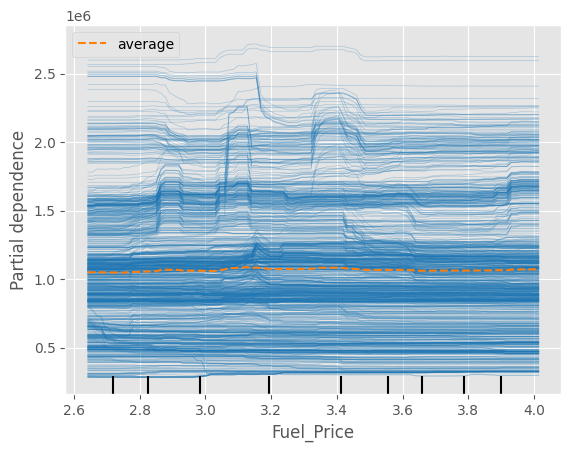

<Figure size 3000x1200 with 0 Axes>

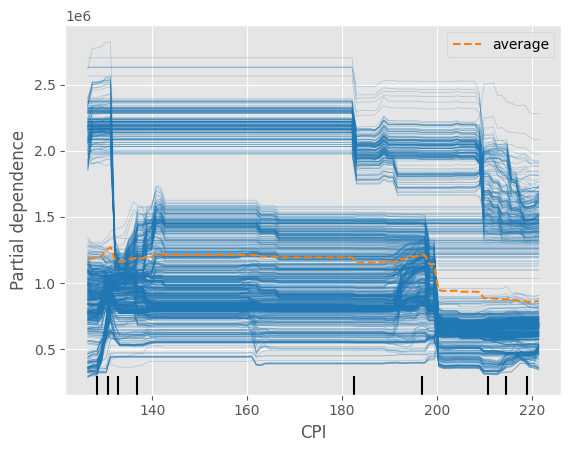

<Figure size 3000x1200 with 0 Axes>

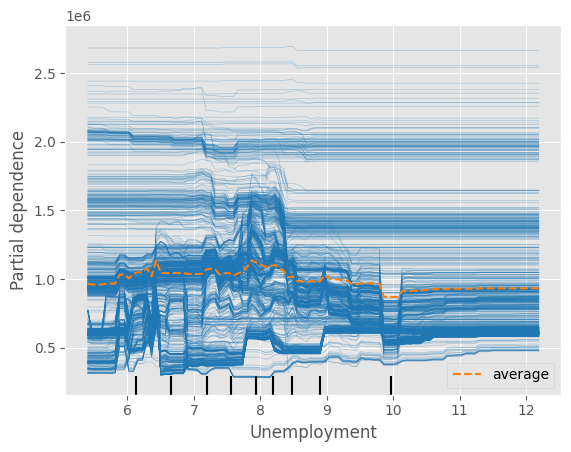

<Figure size 3000x1200 with 0 Axes>

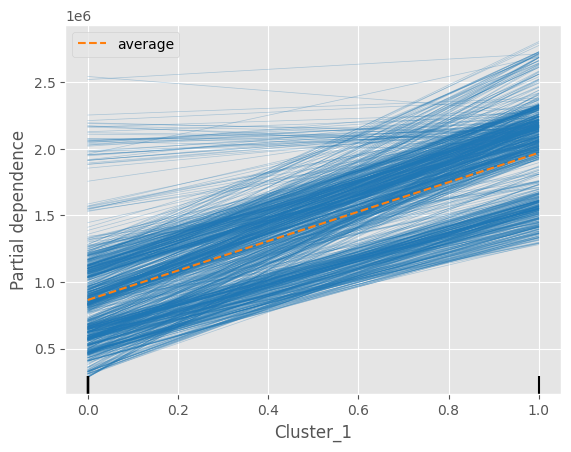

<Figure size 3000x1200 with 0 Axes>

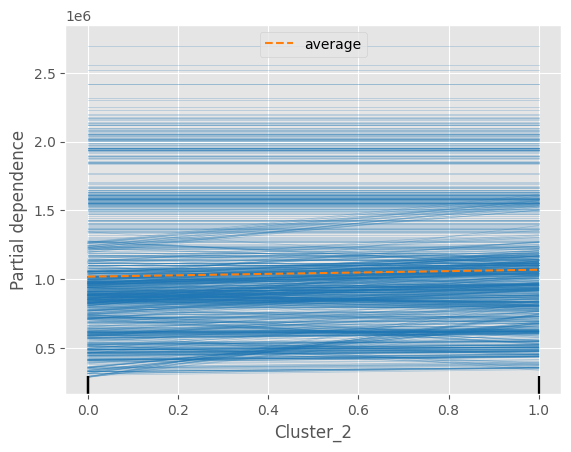

<Figure size 3000x1200 with 0 Axes>

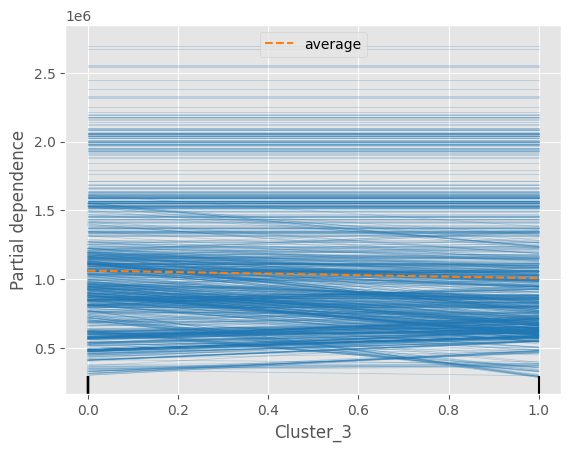

<Figure size 3000x1200 with 0 Axes>

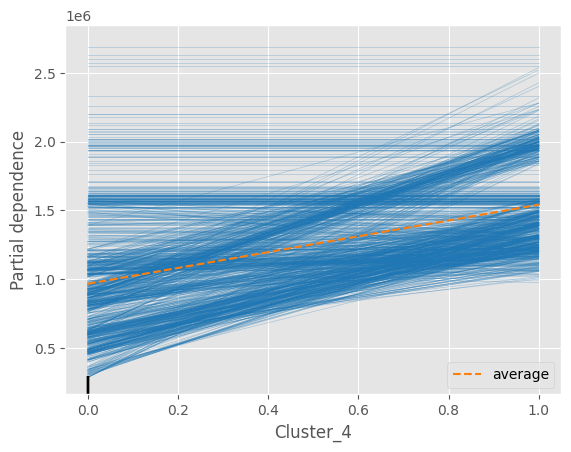

<Figure size 3000x1200 with 0 Axes>

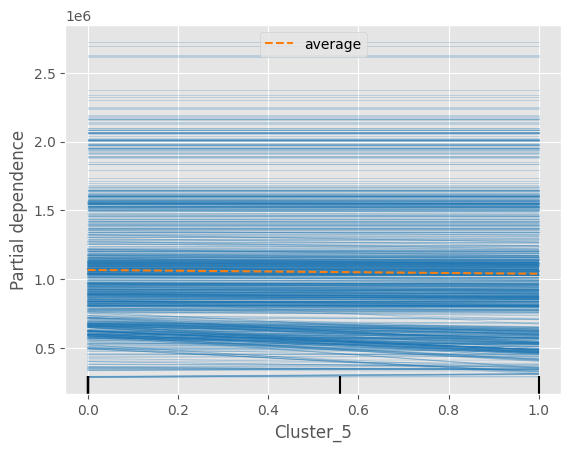

<Figure size 3000x1200 with 0 Axes>

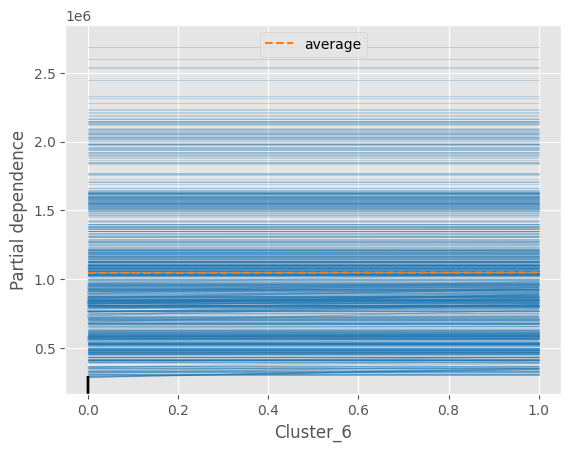

<Figure size 3000x1200 with 0 Axes>

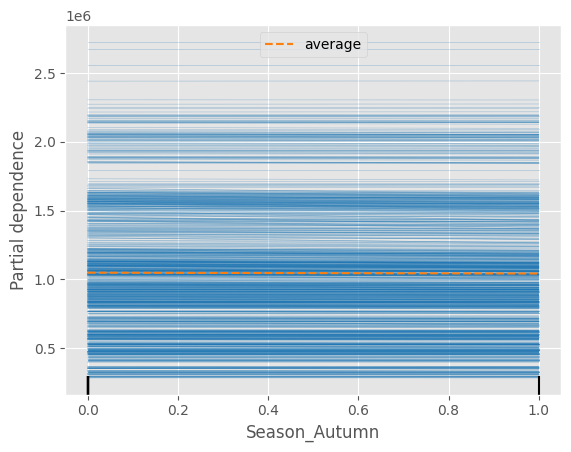

<Figure size 3000x1200 with 0 Axes>

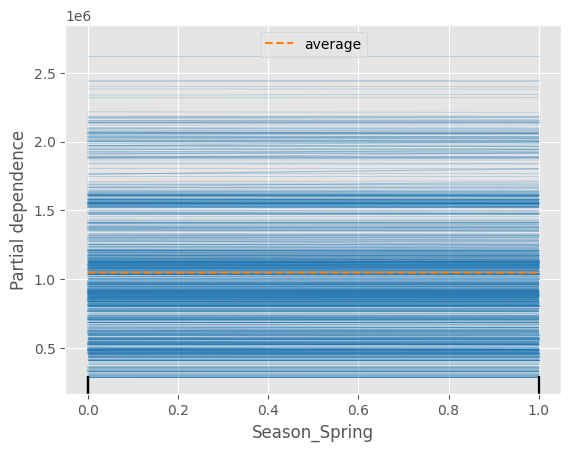

<Figure size 3000x1200 with 0 Axes>

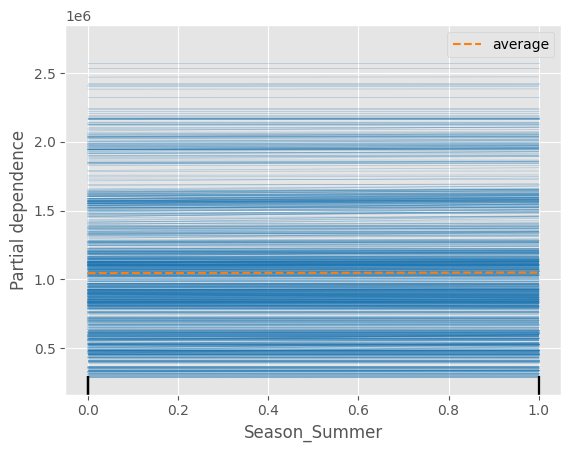

<Figure size 3000x1200 with 0 Axes>

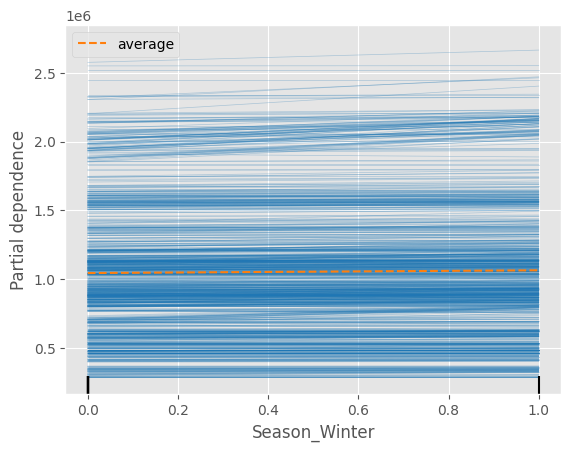

<Figure size 3000x1200 with 0 Axes>

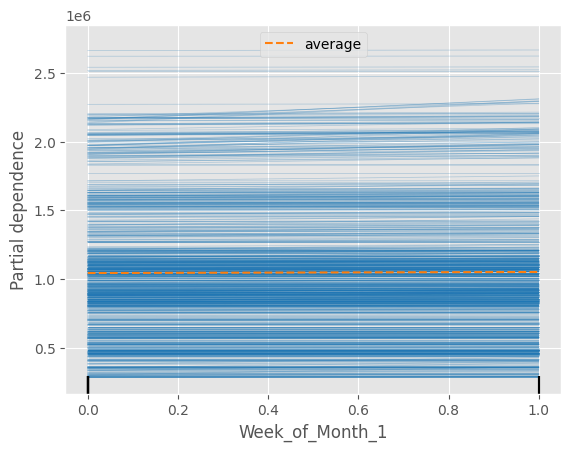

<Figure size 3000x1200 with 0 Axes>

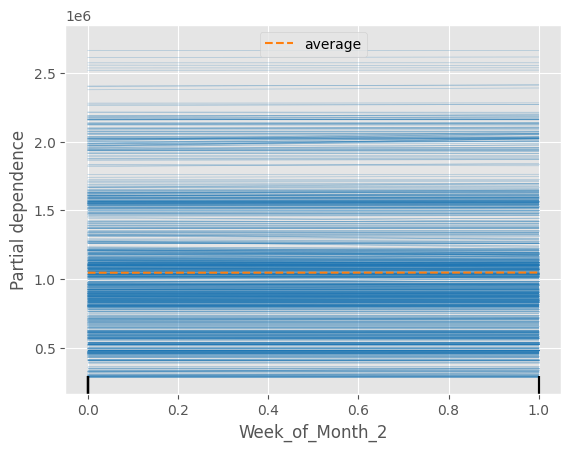

<Figure size 3000x1200 with 0 Axes>

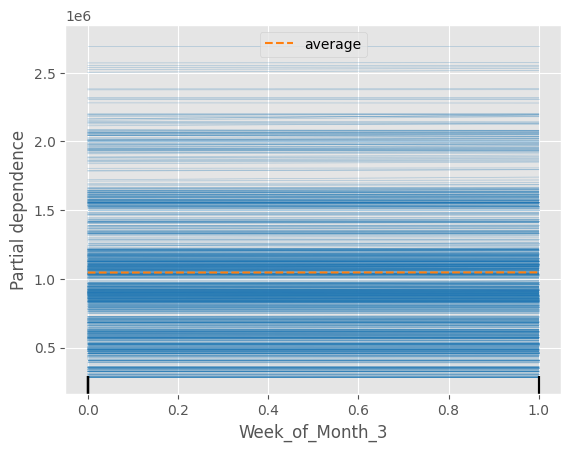

<Figure size 3000x1200 with 0 Axes>

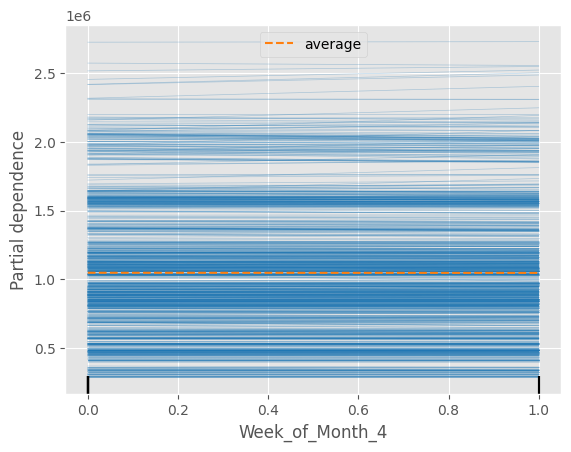

<Figure size 3000x1200 with 0 Axes>

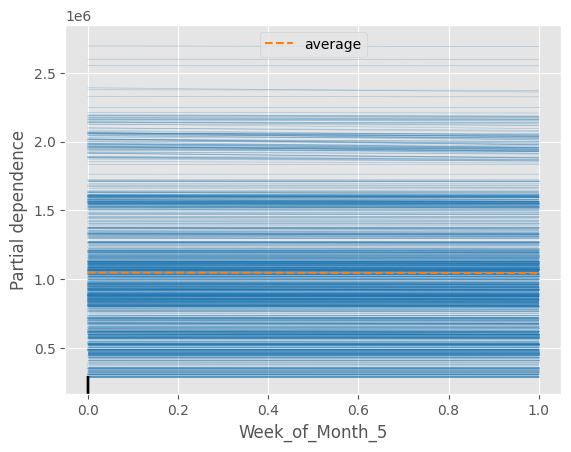

<Figure size 3000x1200 with 0 Axes>

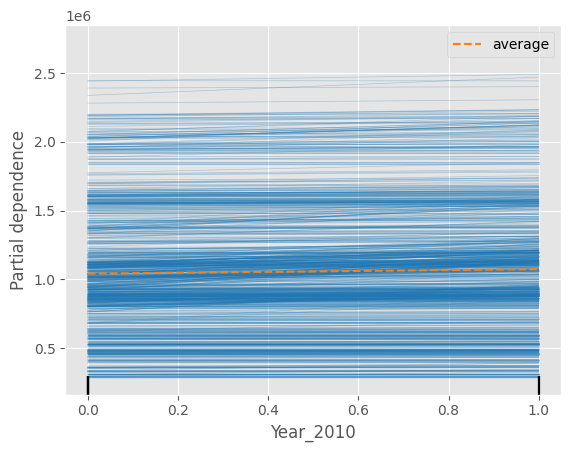

<Figure size 3000x1200 with 0 Axes>

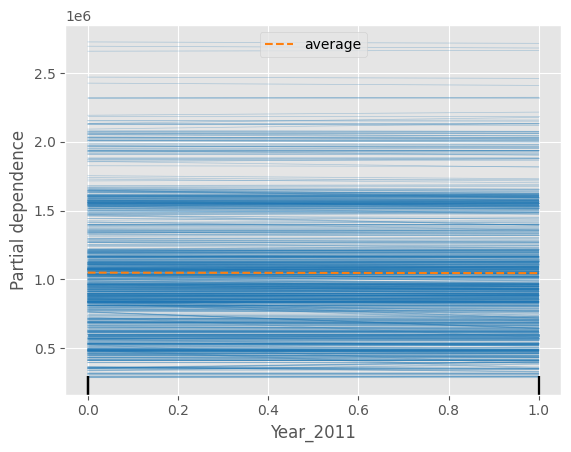

<Figure size 3000x1200 with 0 Axes>

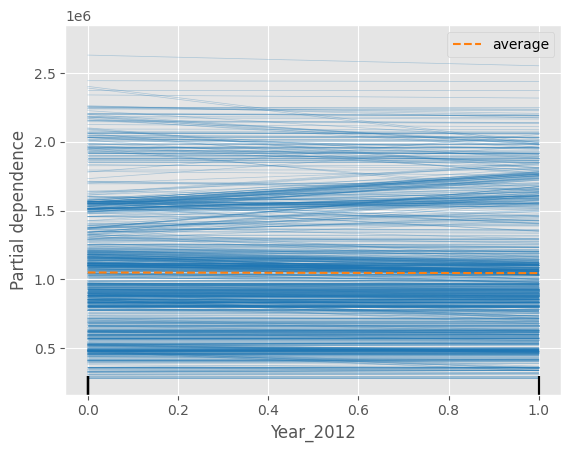

<Figure size 3000x1200 with 0 Axes>

CPU times: user 2min 13s, sys: 4.55 s, total: 2min 17s
Wall time: 2min 20s


In [ ]:
%%time

split_cat = 0

# Do the Random Forest model again
# tune the Hyper parameters base on the result of GridSearchCV

features = ['Temperature', 'Fuel_Price', 'CPI', 'Unemployment', 'Cluster', 'Season', 'Week_of_Month', 'Year']

X = pd.get_dummies(df.loc[df['Holiday_Flag'] == split_cat][features], columns = ['Cluster', 'Season', 'Week_of_Month', 'Year'])
y = df.loc[df['Holiday_Flag'] == split_cat]['Weekly_Sales']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size = 0.2,
                                                    random_state = 0,
                                                   )

# Initialize and fit the Random Forest Regressor
rf_model_0 = RandomForestRegressor(n_estimators = 200,
                                 random_state = 0,
                                 max_depth = 10,
                                 min_samples_leaf = 2,
                                 min_samples_split = 10,
                                )
rf_model_0.fit(X_train, y_train)

# Get feature importances
feature_importances = pd.DataFrame({
    'Feature': X.columns,
    'Importance': rf_model_0.feature_importances_
}).sort_values(by = 'Importance', ascending = False)

plt.figure(figsize = (12, 6))
plt.barh(feature_importances['Feature'],
         feature_importances['Importance'],
         color = 'grey',
        )
plt.xlabel('Importance Value')
plt.title(f'Feature Importance for Weekly Sales Prediction (Holiday_Flag = {split_cat})')

# Adding annotations for each bar
for index, value in enumerate(feature_importances['Importance']):
    plt.text(value,
             index,
             f'{value:.3f}',
             va = 'center',
            )

plt.gca().invert_yaxis()  # Invert y-axis to have the most important features at the top
plt.show()

# Final: Evaluate the model's baseline performance
# Making predictions on the test set
y_pred = rf_model_0.predict(X_test)

# Calculating evaluation metrics
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Cross-validation (using 5-fold cross-validation)
cv_scores = cross_val_score(rf_model_0,
                            X,
                            y,
                            cv = 5,
                            scoring = 'r2')
cv_r2_mean = np.mean(cv_scores)

# Display baseline evaluation metrics
baseline_metrics = {
    'Mean Squared Error': mse,
    'Mean Absolute Error': mae,
    'R-squared (Test Set)': r2,
    'Cross-Validated R-squared (Mean)': cv_r2_mean
}
baseline_metrics = {
    'Mean Squared Error': f'{mse:.3f}',
    'Mean Absolute Error': f'{mae:.3f}',
    'R-squared (Test Set)': f'{r2:.3f}',
    'Cross-Validated R-squared (Mean)': f'{cv_r2_mean:.3f}'
}
baseline_metrics = pd.DataFrame([baseline_metrics])
print(baseline_metrics.T)

for i in X:
    PartialDependenceDisplay.from_estimator(rf_model_0,
                                            X,
                                            [i],
                                            kind = 'both',
                                           )
    plt.figure(figsize = (15, 6),
               dpi = 200,
              )
    plt.show()

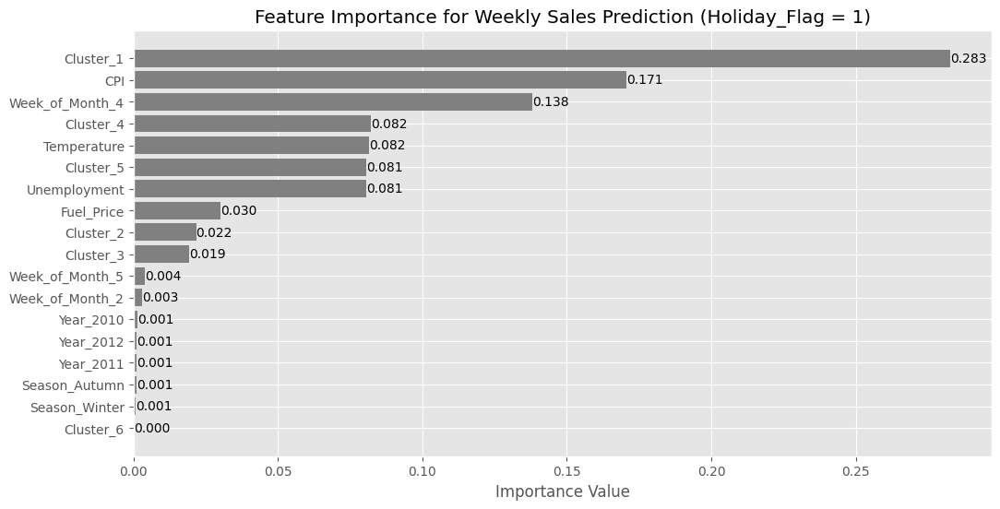

                                                 0
Mean Squared Error                182062293934.093
Mean Absolute Error                     324185.610
R-squared (Test Set)                         0.504
Cross-Validated R-squared (Mean)             0.558


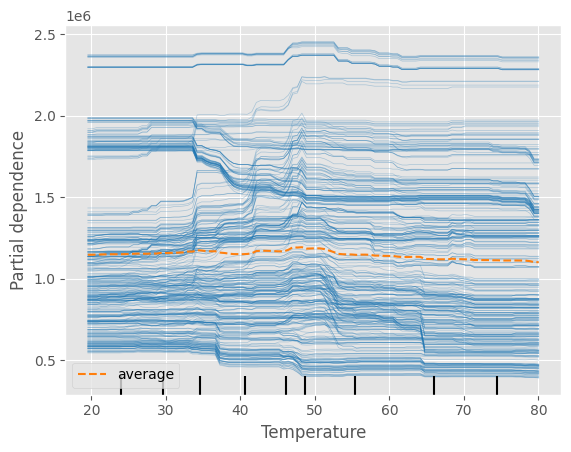

<Figure size 3000x1200 with 0 Axes>

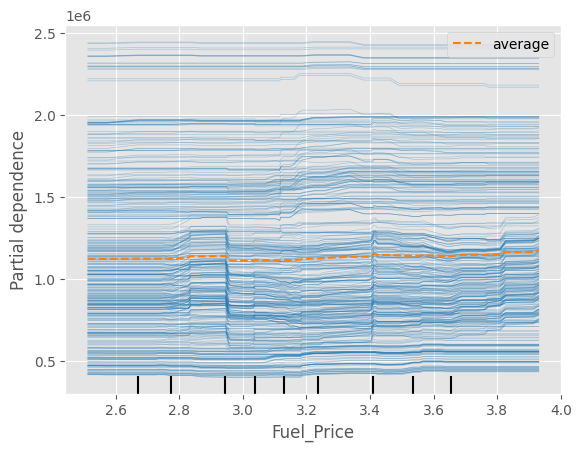

<Figure size 3000x1200 with 0 Axes>

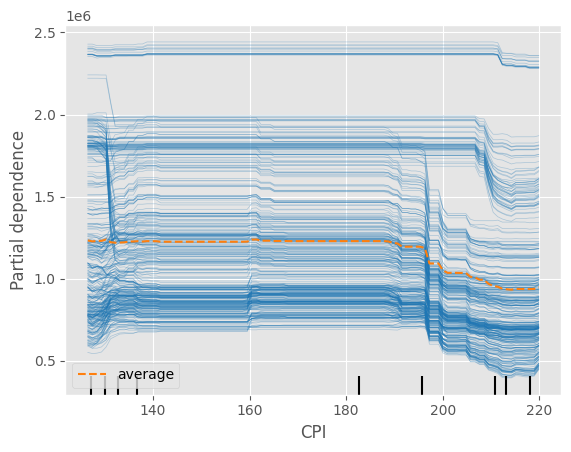

<Figure size 3000x1200 with 0 Axes>

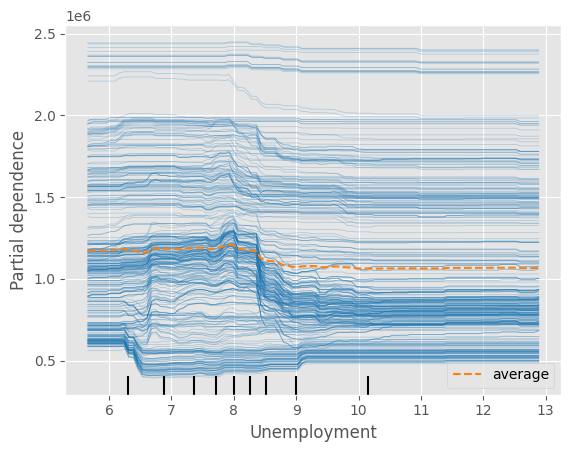

<Figure size 3000x1200 with 0 Axes>

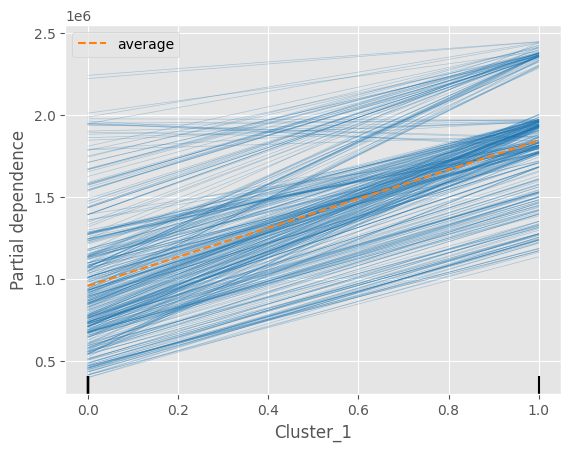

<Figure size 3000x1200 with 0 Axes>

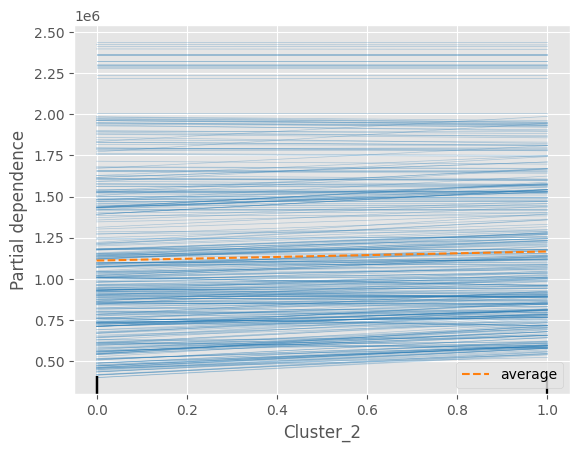

<Figure size 3000x1200 with 0 Axes>

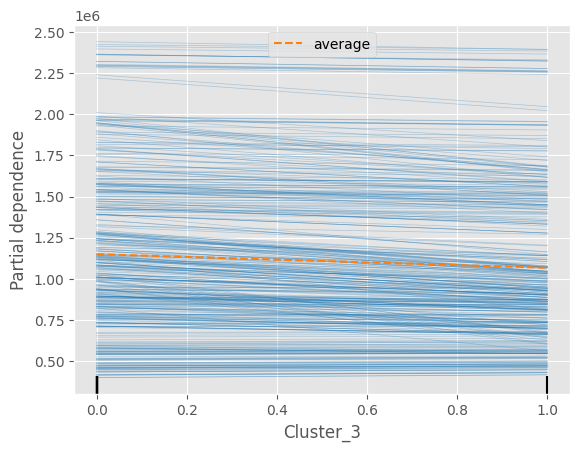

<Figure size 3000x1200 with 0 Axes>

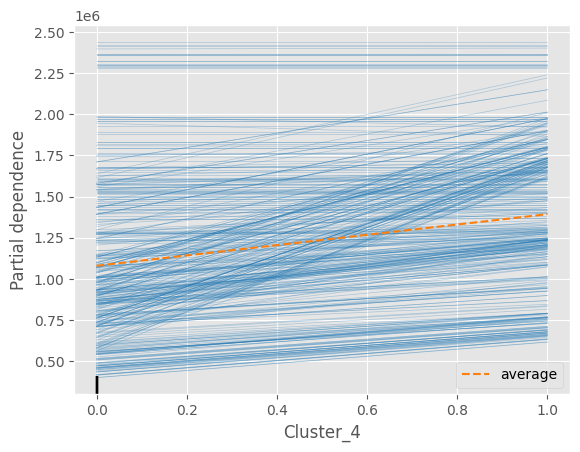

<Figure size 3000x1200 with 0 Axes>

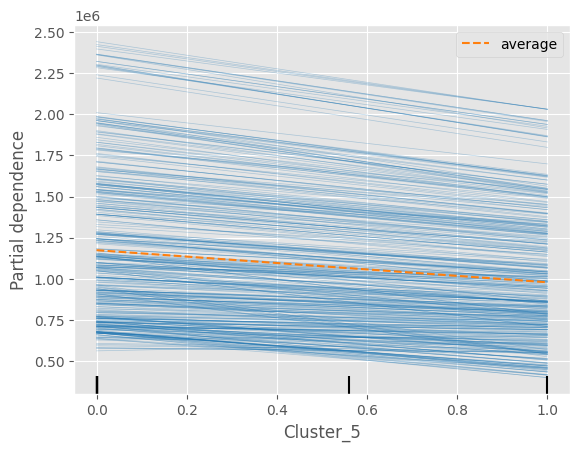

<Figure size 3000x1200 with 0 Axes>

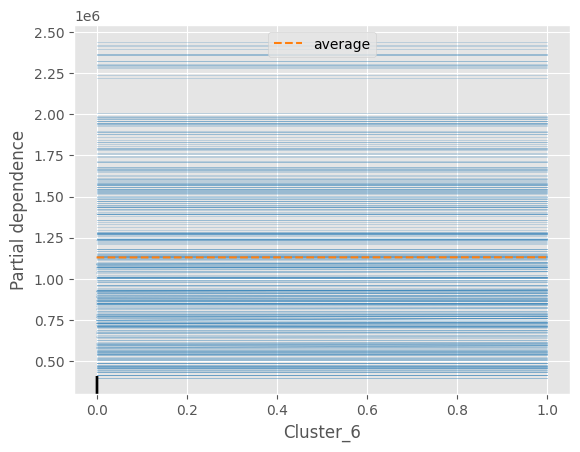

<Figure size 3000x1200 with 0 Axes>

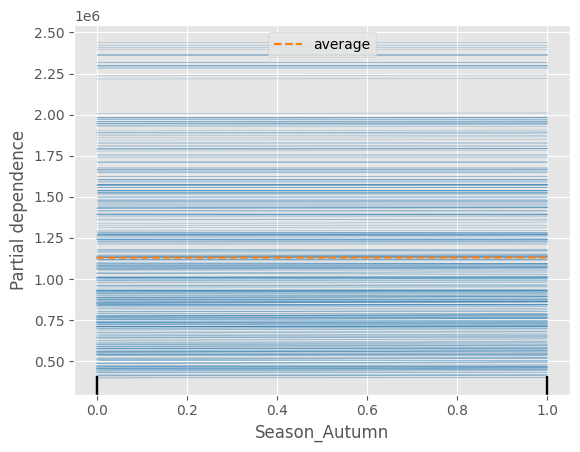

<Figure size 3000x1200 with 0 Axes>

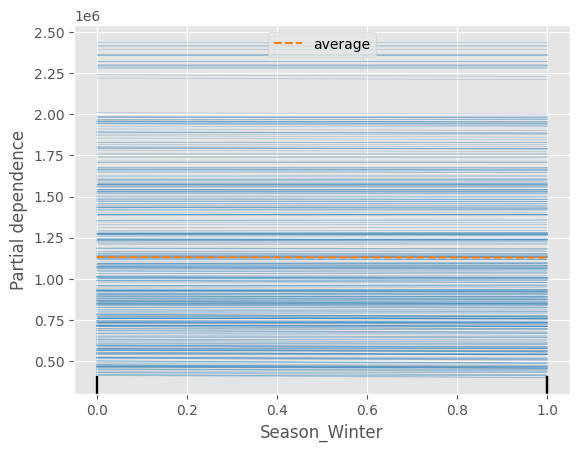

<Figure size 3000x1200 with 0 Axes>

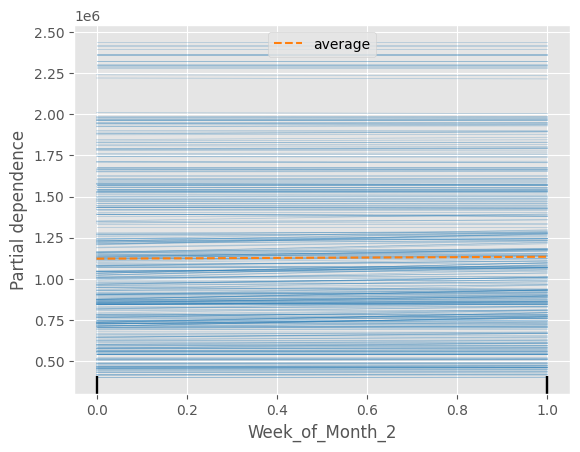

<Figure size 3000x1200 with 0 Axes>

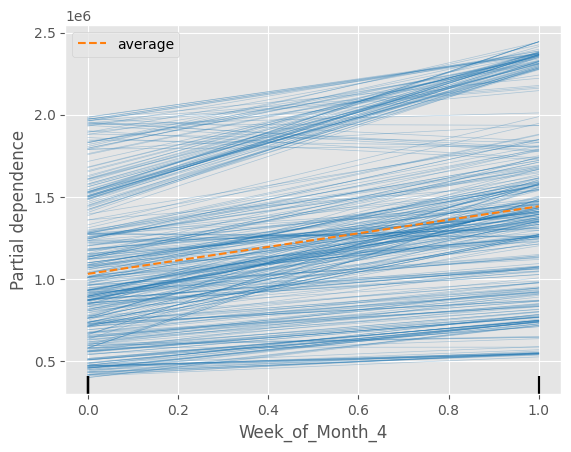

<Figure size 3000x1200 with 0 Axes>

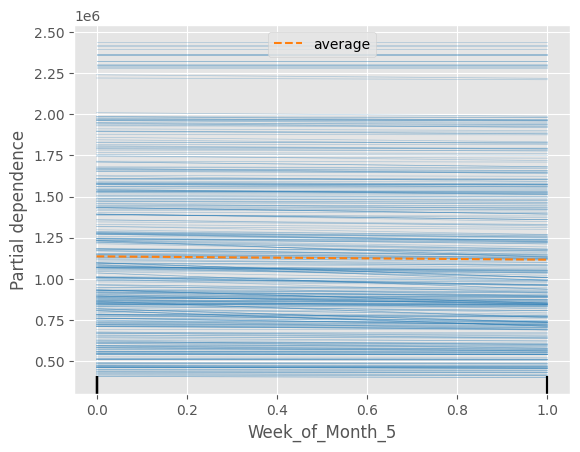

<Figure size 3000x1200 with 0 Axes>

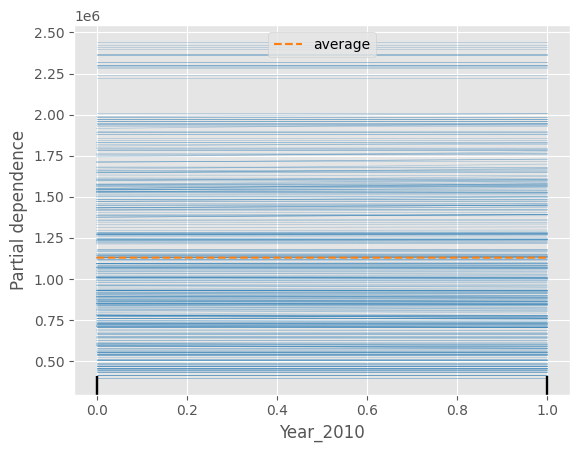

<Figure size 3000x1200 with 0 Axes>

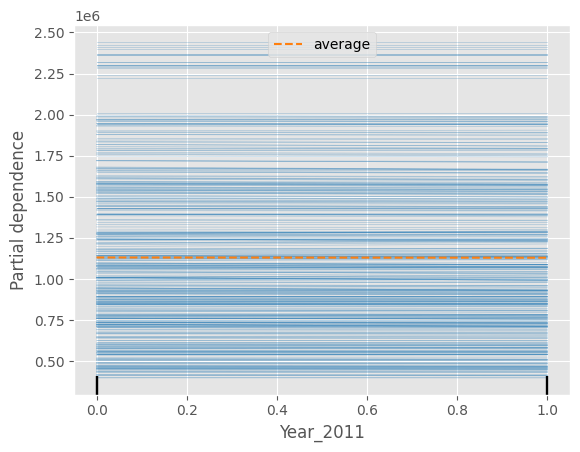

<Figure size 3000x1200 with 0 Axes>

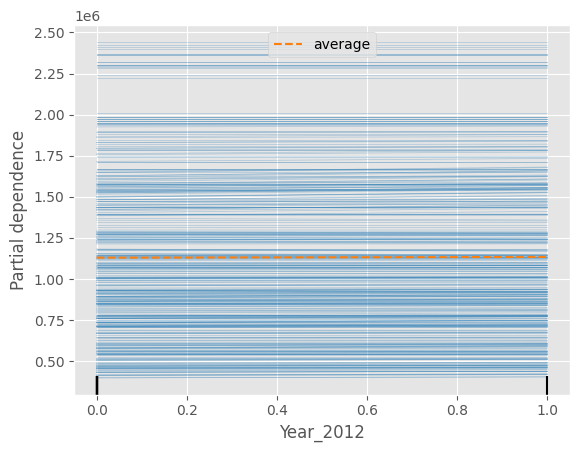

<Figure size 3000x1200 with 0 Axes>

CPU times: user 36.4 s, sys: 2.44 s, total: 38.8 s
Wall time: 37.3 s


In [ ]:
%%time

split_cat = 1

# Do the Random Forest model again
# tune the Hyper parameters base on the result of GridSearchCV

features = ['Temperature', 'Fuel_Price', 'CPI', 'Unemployment', 'Cluster', 'Season', 'Week_of_Month', 'Year']

X = pd.get_dummies(df.loc[df['Holiday_Flag'] == split_cat][features], columns = ['Cluster', 'Season', 'Week_of_Month', 'Year'])
y = df.loc[df['Holiday_Flag'] == split_cat]['Weekly_Sales']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size = 0.2,
                                                    random_state = 0,
                                                   )

# Initialize and fit the Random Forest Regressor
rf_model_1 = RandomForestRegressor(n_estimators = 100,
                                 random_state = 0,
                                 max_depth = 10,
                                 min_samples_leaf = 4,
                                 min_samples_split = 10,
                                )
rf_model_1.fit(X_train, y_train)

# Get feature importances
feature_importances = pd.DataFrame({
    'Feature': X.columns,
    'Importance': rf_model_1.feature_importances_
}).sort_values(by = 'Importance', ascending = False)

plt.figure(figsize = (12, 6))
plt.barh(feature_importances['Feature'],
         feature_importances['Importance'],
         color = 'grey',
        )
plt.xlabel('Importance Value')
plt.title(f'Feature Importance for Weekly Sales Prediction (Holiday_Flag = {split_cat})')

# Adding annotations for each bar
for index, value in enumerate(feature_importances['Importance']):
    plt.text(value,
             index,
             f'{value:.3f}',
             va = 'center',
            )

plt.gca().invert_yaxis()  # Invert y-axis to have the most important features at the top
plt.show()

# Final: Evaluate the model's baseline performance
# Making predictions on the test set
y_pred = rf_model_1.predict(X_test)

# Calculating evaluation metrics
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Cross-validation (using 5-fold cross-validation)
cv_scores = cross_val_score(rf_model_1,
                            X,
                            y,
                            cv = 5,
                            scoring = 'r2')
cv_r2_mean = np.mean(cv_scores)

# Display baseline evaluation metrics
baseline_metrics = {
    'Mean Squared Error': mse,
    'Mean Absolute Error': mae,
    'R-squared (Test Set)': r2,
    'Cross-Validated R-squared (Mean)': cv_r2_mean
}
baseline_metrics = {
    'Mean Squared Error': f'{mse:.3f}',
    'Mean Absolute Error': f'{mae:.3f}',
    'R-squared (Test Set)': f'{r2:.3f}',
    'Cross-Validated R-squared (Mean)': f'{cv_r2_mean:.3f}'
}
baseline_metrics = pd.DataFrame([baseline_metrics])
print(baseline_metrics.T)

for i in X:
    PartialDependenceDisplay.from_estimator(rf_model_1,
                                            X,
                                            [i],
                                            kind = 'both',
                                           )
    plt.figure(figsize = (15, 6),
               dpi = 200,
              )
    plt.show()

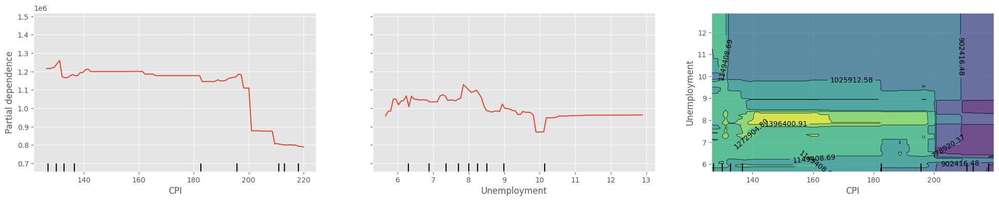

In [ ]:
features_index = [2, 3, (2, 3)]

fig, ax = plt.subplots(figsize = (24, 4))

display = PartialDependenceDisplay.from_estimator(
    rf_model_0,
    X,
    features_index,
    ax = ax,
    # kind = 'both',
)

display.figure_.savefig('var_pdp_plot.png',
                        dpi = 300,
                        bbox_inches = 'tight'
                       )

plt.show()

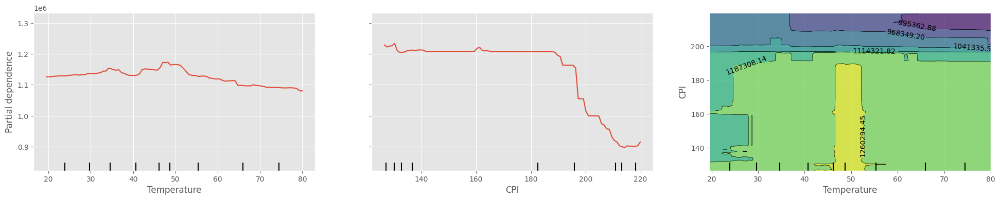

In [ ]:
features_index = [0, 2, (0, 2)]

fig, ax = plt.subplots(figsize = (24, 4))

display = PartialDependenceDisplay.from_estimator(
    rf_model_1,
    X,
    features_index,
    ax = ax,
    # kind = 'both',
)

display.figure_.savefig('var_pdp_plot.png',
                        dpi = 300,
                        bbox_inches = 'tight'
                       )

plt.show()

## **Hypothesis on Geographical Distribution or Performance Clustering**
### **K-means Cluster**
- Due to the geographic distribution of these 45 stores, some value may not have the same impacting effect on 'Weekly_Sales'

#### **Evaluate & Optimize the Cluster**
##### **Elbow Method**

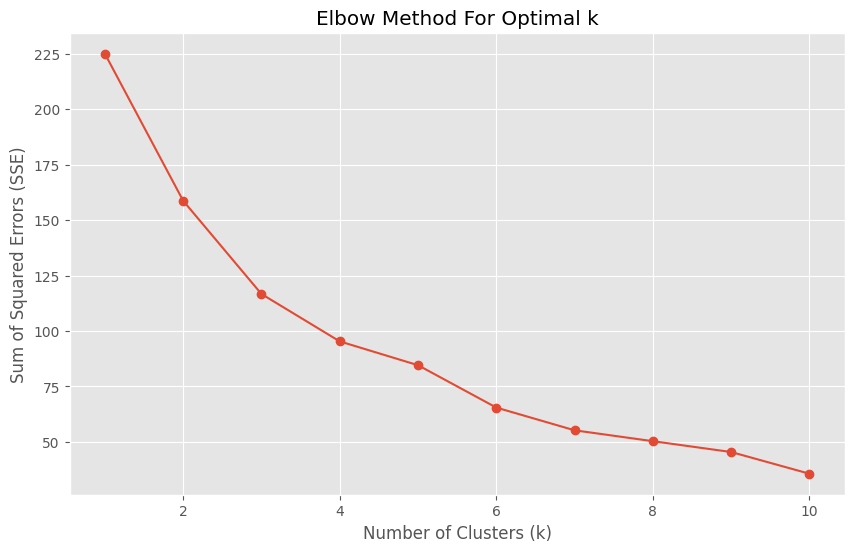

CPU times: user 314 ms, sys: 115 ms, total: 429 ms
Wall time: 351 ms


In [ ]:
%%time

walmart_data = df.groupby('Store_id')[[
    'Weekly_Sales', 'Temperature', 'Fuel_Price',
    'CPI', 'Unemployment'
    ]].median().reset_index()

selected_columns = [
    'Weekly_Sales', 'Temperature', 'Fuel_Price',
    'CPI', 'Unemployment'
    ]

walmart_data_selected = walmart_data[selected_columns]
walmart_data_selected.fillna(walmart_data_selected.mean(), inplace=True)

scaler = StandardScaler()
walmart_data_scaled = scaler.fit_transform(walmart_data_selected)

sse = []
k_values = range(1, 11)
for k in k_values:
    kmeans = KMeans(
        n_clusters = k,
        random_state = 0,
        )
    kmeans.fit(walmart_data_scaled)
    sse.append(kmeans.inertia_)

# Plot the Elbow Method
plt.figure(
    figsize = (10, 6),
    dpi = 100,
    )
plt.plot(k_values,
         sse,
         marker = 'o',
        )
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Sum of Squared Errors (SSE)')
plt.title('Elbow Method For Optimal k')
plt.grid(True)
plt.show()

##### **Silhouette Score to Verify the Result of K-means**

In [ ]:
def plot_silhouette_analysis(data, k_values, rows = 3, cols = 2):
    fig, axes = plt.subplots(rows, cols, figsize=(15, 18))
    axes = axes.flatten()

    custom_colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2']

    for idx, k in enumerate(k_values):
        if idx >= rows * cols:
            break

        # Perform KMeans clustering
        kmeans = KMeans(n_clusters = k,
                        random_state = 0,
                       )
        cluster_labels = kmeans.fit_predict(data)

        # Calculate silhouette scores
        silhouette_avg = silhouette_score(data, cluster_labels)
        sample_silhouette_values = silhouette_samples(data, cluster_labels)

        y_lower = 10  # Margin for silhouette plot
        ax = axes[idx]

        for i in range(k):
            # Aggregate the silhouette scores for samples belonging to cluster i
            ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = color = custom_colors[i % len(custom_colors)]
            ax.fill_betweenx(np.arange(y_lower, y_upper),
                             0,
                             ith_cluster_silhouette_values,
                             facecolor = color,
                             edgecolor = color,
                             alpha = 0.7,
                            )

            # Label silhouette plot with cluster number
            ax.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
            y_lower = y_upper + 10  # Add margin between clusters

        # Vertical line for average silhouette score
        ax.axvline(x = silhouette_avg,
                   color = "red",
                   linestyle = "--",
                   label = f"Avg Silhouette: {silhouette_avg:.2f}",
                  )
        ax.legend(loc = 'upper right')
        ax.set_title(f"Silhouette plot for k = {k}")
        ax.set_xlabel("Silhouette coefficient values")
        ax.set_ylabel("Cluster label")
        ax.set_xlim([-0.1, 1])
        ax.set_ylim([0, len(data) + (k + 1) * 10])
        ax.set_yticks([])  # Clear y-axis labels

    # Adjust layout and show plot
    plt.tight_layout()
    plt.show()

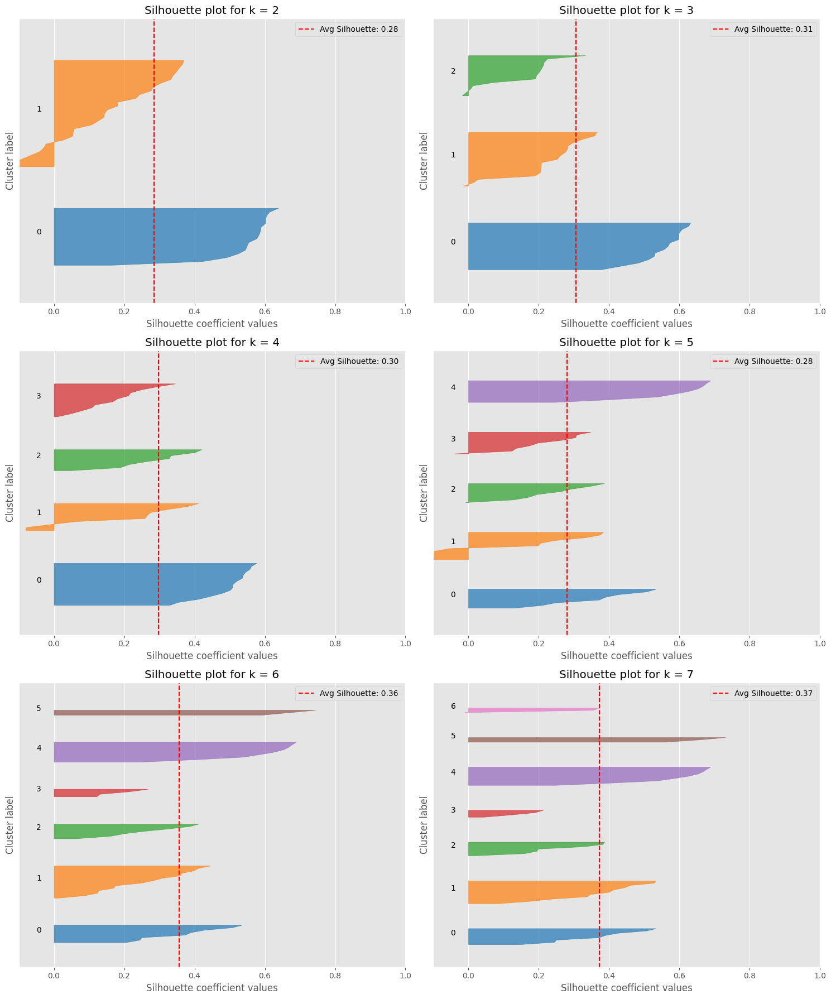

In [ ]:
# Define the range of k to analyze
k_values = range(2, 8)
plot_silhouette_analysis(walmart_data_scaled, k_values)

##### **Decide the Optimal K**

In [ ]:
%%time

optimal_k = 6
kmeans = KMeans(
    n_clusters = optimal_k,
    random_state = 0,
    )
kmeans.fit(walmart_data_scaled)

walmart_data['cluster'] = kmeans.fit_predict(walmart_data_scaled)
walmart_data['cluster'] = walmart_data['cluster'].apply(lambda x: x+1)

CPU times: user 10.6 ms, sys: 1.03 ms, total: 11.6 ms
Wall time: 11.8 ms


##### **Mapping the Cluster Result back to the orignial df**

In [ ]:
store_cluster_dict = dict(zip(walmart_data['Store_id'], walmart_data['cluster']))

df['Cluster'] = df['Store_id'].map(store_cluster_dict)
df.head()

,Store_id,date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,Season,Week_of_Month,Year,Cluster
0,1,2010-02-05,1643691,0,42.31,2.572,211.096358,8.106,Winter,1,2010,1
1,2,2010-02-05,2136989,0,40.19,2.572,210.752605,8.324,Winter,1,2010,1
2,3,2010-02-05,461622,0,45.71,2.572,214.424881,7.368,Winter,1,2010,5
3,4,2010-02-05,2135144,0,43.76,2.598,126.442065,8.623,Winter,1,2010,4
4,5,2010-02-05,317173,0,39.70,2.572,211.653972,6.566,Winter,1,2010,5


#### **Dimension Deduction**

In [ ]:
%%time
pca = PCA(n_components = 2)
pca_result = pca.fit_transform(walmart_data_scaled)

# Add PCA result to DataFrame
walmart_data['PCA1'] = pca_result[:, 0]
walmart_data['PCA2'] = pca_result[:, 1]

CPU times: user 5.48 ms, sys: 984 µs, total: 6.46 ms
Wall time: 23.2 ms


In [ ]:
store_pca1_dict = dict(zip(walmart_data['Store_id'], walmart_data['PCA1']))
store_pca2_dict = dict(zip(walmart_data['Store_id'], walmart_data['PCA2']))

df['PCA1'] = df['Store_id'].map(store_pca1_dict)
df['PCA2'] = df['Store_id'].map(store_pca2_dict)
df.head()

,Store_id,date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,Season,Week_of_Month,Year,Cluster,PCA1,PCA2
0,1,2010-02-05,1643691,0,42.31,2.572,211.096358,8.106,Winter,1,2010,1,-1.411849,0.327205
1,2,2010-02-05,2136989,0,40.19,2.572,210.752605,8.324,Winter,1,2010,1,-1.317822,0.041176
2,3,2010-02-05,461622,0,45.71,2.572,214.424881,7.368,Winter,1,2010,5,-1.740365,1.257885
3,4,2010-02-05,2135144,0,43.76,2.598,126.442065,8.623,Winter,1,2010,4,-0.319075,-1.469276
4,5,2010-02-05,317173,0,39.70,2.572,211.653972,6.566,Winter,1,2010,5,-1.853345,0.875587


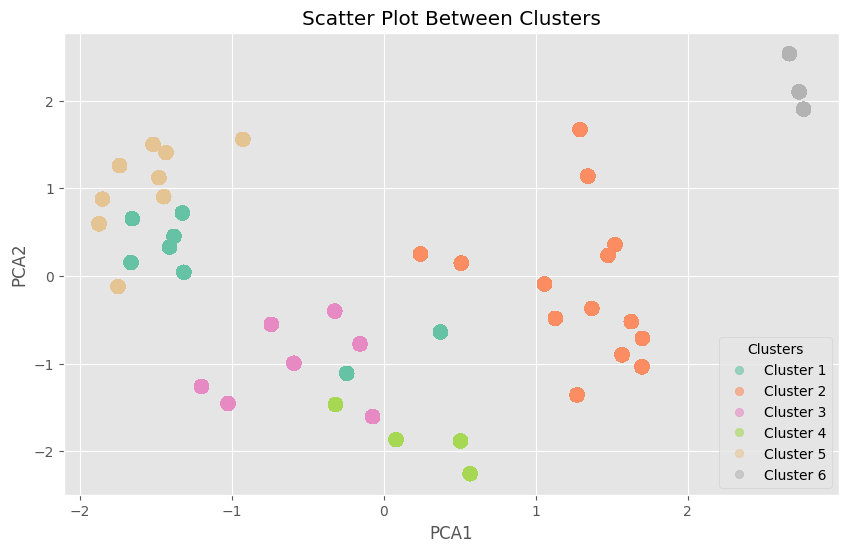

CPU times: user 481 ms, sys: 114 ms, total: 595 ms
Wall time: 500 ms


In [ ]:
%%time

# low_saturation_colors = ['#A6CEE3', '#1F78B4', '#CAB2D6', '#33A02C', '#FB9A99']
# cmap = ListedColormap(low_saturation_colors)

plt.figure(
    figsize = (10, 6),
    dpi = 100,
    )

colors = df['Cluster'].astype(float)

scatter = plt.scatter(
    df['PCA1'],
    df['PCA2'],
    c = colors,
    cmap = 'Set2',
    marker = 'o',
    s = 100,
    alpha = 1,
    )

handles, labels = scatter.legend_elements(
    prop = 'colors',
    alpha = 0.6,
    )

legend_labels = [f"Cluster {int(label)}" for label in np.unique(df['Cluster'])]

plt.legend(
    handles,
    legend_labels,
    title = 'Clusters',
    loc = 'lower right',
    )

plt.xlabel('PCA1')
plt.ylabel('PCA2')
plt.title('Scatter Plot Between Clusters')
plt.grid(True)

# 顯示圖表
plt.show()

In [ ]:
df.to_csv('20241120_walmart_data.csv', index = False)

#### **Testify the Difference between Clusters**

##### *AONVA*

In [ ]:
walmart_data = df.copy()
walmart_data['cluster'] = walmart_data['Cluster']

In [ ]:
%%time
metrics = ['Weekly_Sales', 'Temperature', 'Fuel_Price', 'CPI', 'Unemployment']

for i in metrics:
    print('_'*100)
    anova_data = [walmart_data[walmart_data['cluster'] == cluster][i] for cluster in walmart_data['cluster'].unique()]
    f_stat, p_value = f_oneway(*anova_data)
    print(i)
    # f_stat, p_value
    print(f"F-statistic: {f_stat:.2f}")
    print(f"p-value: {p_value:.5f}")
    tukey_result = pairwise_tukeyhsd(endog = walmart_data[i],
                                     groups = walmart_data['cluster'],
                                     alpha = 0.05,
                                    )
    print(tukey_result)

____________________________________________________________________________________________________
Weekly_Sales
F-statistic: 1241.58
p-value: 0.00000
        Multiple Comparison of Means - Tukey HSD, FWER=0.05         
group1 group2   meandiff   p-adj      lower         upper     reject
--------------------------------------------------------------------
     1      2 -656205.8455    0.0    -699562.88   -612848.811   True
     1      3 -902626.6857    0.0  -953256.7941  -851996.5773   True
     1      4  -63773.5759 0.0292  -123679.9281    -3867.2238   True
     1      5  -1131804.07    0.0  -1179339.284 -1084268.8559   True
     1      6 -768449.7753    0.0  -834678.7395  -702220.8111   True
     2      3 -246420.8402    0.0  -291705.7859  -201135.8946   True
     2      4  592432.2696    0.0   536969.7646   647894.7745   True
     2      5 -475598.2245    0.0  -517394.3367  -433802.1122   True
     2      6 -112243.9298    0.0  -174482.1345   -50005.7251   True
     3      4  83885

##### *Median*

In [ ]:
cluster_means_filtered = walmart_data.groupby('cluster')[[
    'Weekly_Sales', 'Temperature', 'Fuel_Price',
    'CPI', 'Unemployment']].median().reset_index()

store_nunique_filtered = walmart_data.groupby('cluster')['Store_id'].nunique().to_frame('Store_Count').reset_index()

stat_df = pd.merge(cluster_means_filtered,
                   store_nunique_filtered,
                   on = 'cluster')

stat_df['Weekly_Sales'] = stat_df['Weekly_Sales'].apply(lambda x: np.around(x, 2))
stat_df['Temperature'] = stat_df['Temperature'].apply(lambda x: np.around(x, 2))
stat_df['Fuel_Price'] = stat_df['Fuel_Price'].apply(lambda x: np.around(x, 2))
stat_df['CPI'] = stat_df['CPI'].apply(lambda x: np.around(x, 2))
stat_df['Unemployment'] = stat_df['Unemployment'].apply(lambda x: np.around(x, 2))

stat_df

,cluster,Weekly_Sales,Temperature,Fuel_Price,CPI,Unemployment,Store_Count
0,1,1535663.0,69.42,3.27,214.93,7.86,8
1,2,973489.5,56.26,3.61,134.68,8.49,14
2,3,685700.0,47.28,3.23,192.83,6.93,7
3,4,1657628.5,51.16,3.41,131.86,5.36,4
4,5,517355.0,69.88,3.27,214.93,7.93,9
5,6,988713.0,68.27,3.69,129.04,13.74,3


##### *Violin Plot*

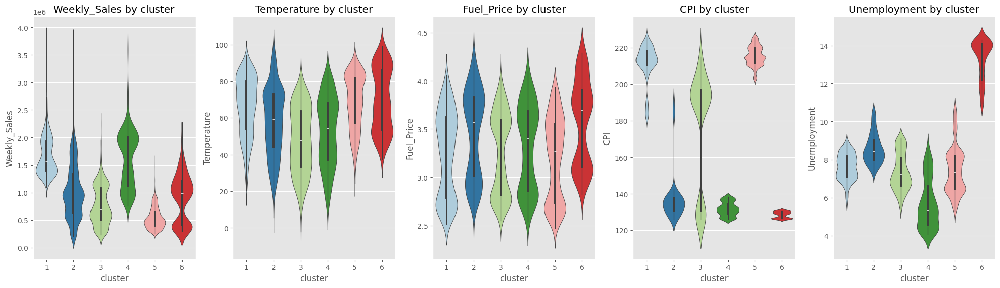

In [ ]:
metrics = ['Weekly_Sales', 'Temperature', 'Fuel_Price', 'CPI', 'Unemployment']
walmart_data['cluster'] = walmart_data['cluster'].astype(str)  # Ensure cluster column is string for categorical plotting

palette = sns.color_palette('Paired', 6)

# Set up the plot
fig, axes = plt.subplots(1,
                         5,
                         figsize = (20, 6),
                         sharey = False)

# Plot a violin plot for each metric by cluster
for i, metric in enumerate(metrics):
    sns.violinplot(data = walmart_data,
                   x = 'cluster',
                   y = metric,
                   ax = axes[i],
                   palette = palette,
                   order = ['1', '2', '3', '4', '5', '6'],
                  )
    axes[i].set_title(f'{metric} by cluster')
    axes[i].set_xlabel('cluster')
    axes[i].set_ylabel(metric)

plt.tight_layout()
plt.show()

##### *Boxplot*

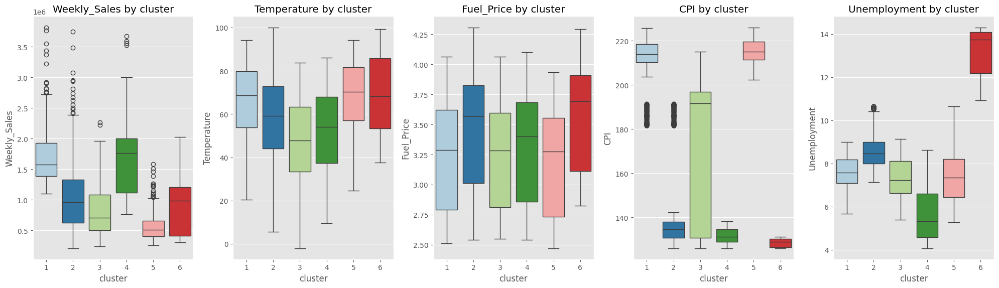

In [ ]:
metrics = ['Weekly_Sales', 'Temperature', 'Fuel_Price', 'CPI', 'Unemployment']
walmart_data['cluster'] = walmart_data['cluster'].astype(str)  # Ensure cluster column is string for categorical plotting

# Set up the plot
fig, axes = plt.subplots(1,
                         5,
                         figsize = (20, 6),
                         sharey = False)

# Plot a violin plot for each metric by cluster
for i, metric in enumerate(metrics):
    sns.boxplot(data = walmart_data,
                x = 'cluster',
                y = metric,
                palette = palette,
                order = ['1', '2', '3', '4', '5', '6'],
                ax = axes[i],
               )
    axes[i].set_title(f'{metric} by cluster')
    axes[i].set_xlabel('cluster')
    axes[i].set_ylabel(metric)

plt.tight_layout()
plt.show()

### **OLS**

In [ ]:
for holiday_status in [0, 1]:
    subset = df[df['Holiday_Flag'] == holiday_status]
    model = smf.ols(formula='Weekly_Sales ~ Temperature + Fuel_Price + CPI + Unemployment', data=subset).fit()
    print(f"Regression for Holiday_Flag = {holiday_status}")
    print(model.summary())
    print("\n")

Regression for Holiday_Flag = 0
                            OLS Regression Results                            
Dep. Variable:           Weekly_Sales   R-squared:                       0.024
Model:                            OLS   Adj. R-squared:                  0.024
Method:                 Least Squares   F-statistic:                     35.53
Date:                Wed, 20 Nov 2024   Prob (F-statistic):           2.35e-29
Time:                        07:48:18   Log-Likelihood:                -83034.
No. Observations:                5670   AIC:                         1.661e+05
Df Residuals:                    5665   BIC:                         1.661e+05
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
Intercept      1

## **Predicting future Weekly_Sales**

### Long Short-Term Memory (LSTM)

In [ ]:
df.groupby('date').agg({'Weekly_Sales': 'sum', 'Holiday_Flag': 'max'}).reset_index()

,date,Weekly_Sales,Holiday_Flag
0,2010-02-05,49750741,0
1,2010-02-12,48336676,1
2,2010-02-19,48276997,0
3,2010-02-26,43968572,0
4,2010-03-05,46871470,0
...,...,...,...
130,2012-08-03,47485901,0
131,2012-08-10,47403453,0
132,2012-08-17,47354450,0
133,2012-08-24,47447324,0


In [ ]:
df

,Store_id,date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,Season,Week_of_Month,Year,Cluster,PCA1,PCA2
0,1,2010-02-05,1643691,0,42.31,2.572,211.096358,8.106,Winter,1,2010,1,-1.411849,0.327205
1,2,2010-02-05,2136989,0,40.19,2.572,210.752605,8.324,Winter,1,2010,1,-1.317822,0.041176
2,3,2010-02-05,461622,0,45.71,2.572,214.424881,7.368,Winter,1,2010,5,-1.740365,1.257885
3,4,2010-02-05,2135144,0,43.76,2.598,126.442065,8.623,Winter,1,2010,4,-0.319075,-1.469276
4,5,2010-02-05,317173,0,39.70,2.572,211.653972,6.566,Winter,1,2010,5,-1.853345,0.875587
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6070,41,2012-08-31,1360518,0,71.56,3.556,198.096734,6.432,Summer,5,2012,3,-1.026939,-1.456513
6071,42,2012-08-31,504761,0,86.97,3.886,130.885355,7.170,Summer,5,2012,2,1.342300,1.139018
6072,43,2012-08-31,593141,0,81.12,3.638,213.673631,9.285,Summer,5,2012,5,-0.929034,1.559047
6073,44,2012-08-31,339491,0,79.18,3.624,130.885355,5.407,Summer,5,2012,3,-0.157801,-0.776859


In [ ]:
df.groupby(['Year', 'Store_id']).agg({'Weekly_Sales':'count'}).reset_index()

,Year,Store_id,Weekly_Sales
0,2010,1,48
1,2010,2,48
2,2010,3,48
3,2010,4,48
4,2010,5,48
...,...,...,...
130,2012,41,35
131,2012,42,35
132,2012,43,35
133,2012,44,35


In [ ]:
# Filter and scale the data

data = (
    df.groupby(['Cluster', 'date'])
    .agg({
        'Weekly_Sales': 'sum',
        'Holiday_Flag': 'mean',
        'Temperature': 'mean',
        'Fuel_Price': 'mean',
        'CPI': 'mean',
        'Unemployment': 'mean'})
    .reset_index()
    .drop(columns = ['date'])
)

data = (
    data.groupby(['Cluster'])
    .apply(lambda v: v.reset_index().drop(columns = ['index', 'Cluster']))
    .reset_index()
    .rename(columns = {'level_1': 'period'})
)

data

,Cluster,period,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,0,14686038,0.0,38.19375,2.62500,206.952519,8.13925
1,1,1,13584238,1.0,37.22250,2.60425,207.093509,8.13925
2,1,2,13876943,0.0,38.98875,2.57175,207.140936,8.13925
3,1,3,12550905,0.0,44.36625,2.60925,207.172769,8.13925
4,1,4,13581676,0.0,45.71000,2.66300,207.204602,8.13925
...,...,...,...,...,...,...,...,...
805,6,130,2804498,0.0,88.16000,3.76000,130.737871,10.92600
806,6,131,2690493,0.0,95.91000,3.81100,130.756161,10.92600
807,6,132,2601067,0.0,94.87000,4.00200,130.790968,10.92600
808,6,133,2644839,0.0,85.32000,4.05500,130.838161,10.92600


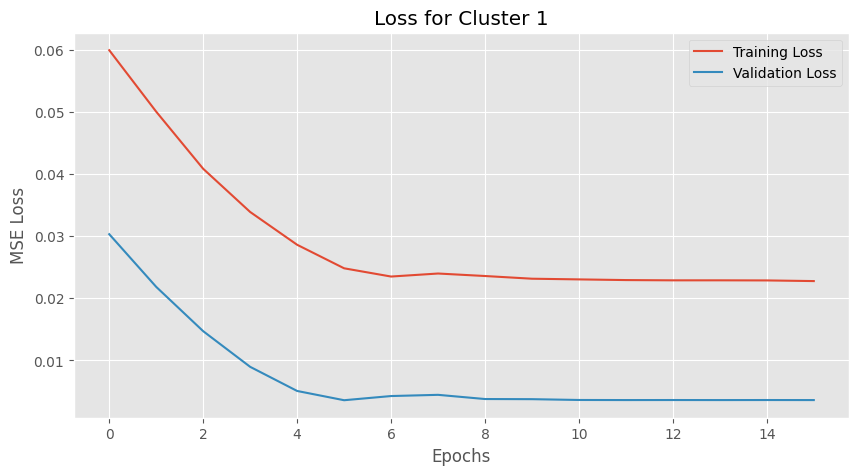

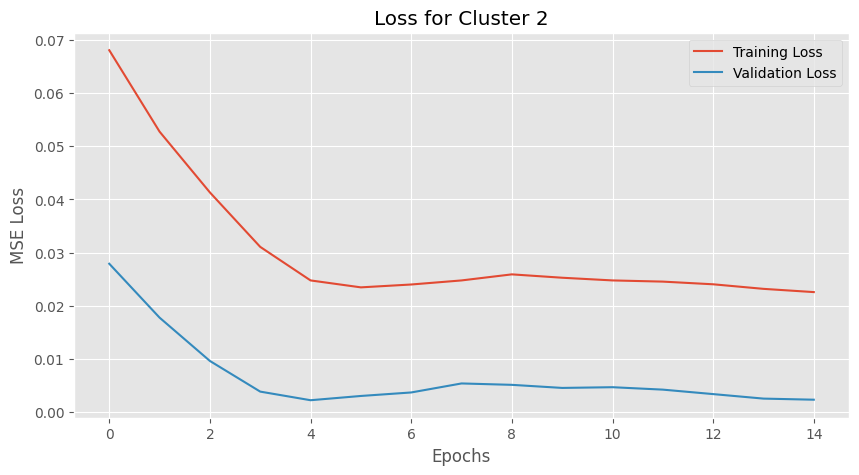

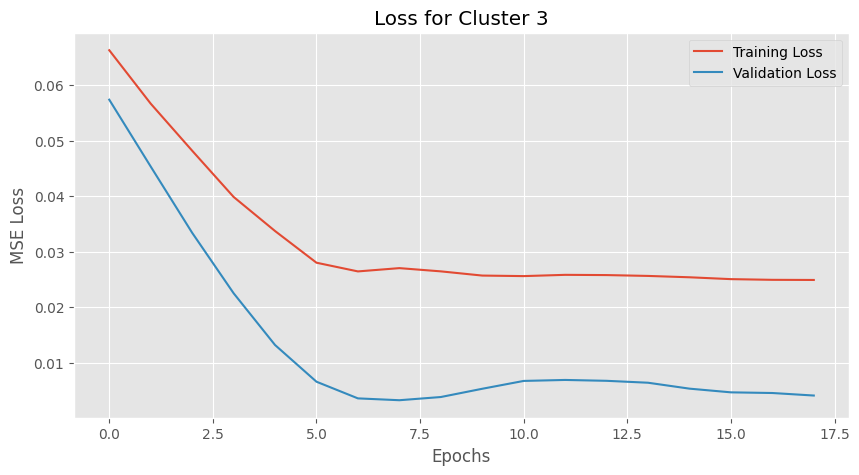

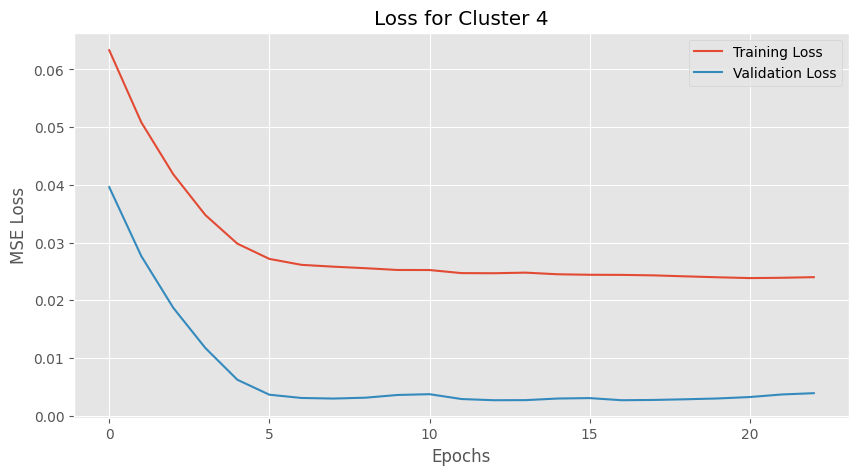

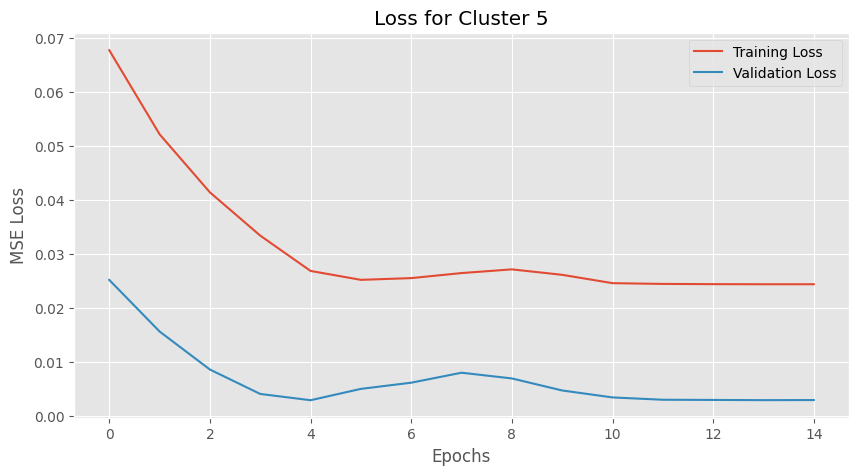

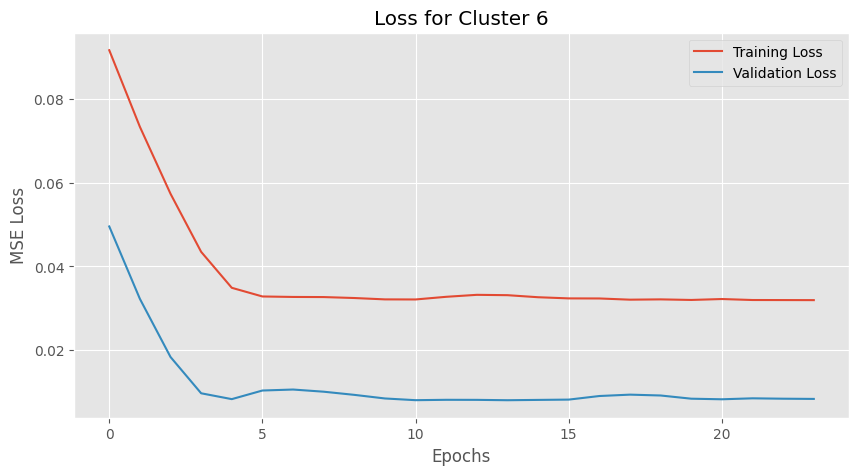

In [ ]:
clusters = data['Cluster'].unique()
results = {}
lookback = 12
utc_plus_8 = pytz.timezone("Asia/Taipei")

# Prediction By Cluster
for cluster in clusters:
    cluster_data = data[data['Cluster'] == cluster].sort_values(by = 'period')

    sales_data = cluster_data['Weekly_Sales'].values.reshape(-1, 1)

    # Standerdized Layer
    scaler = MinMaxScaler()
    sales_data_scaled = scaler.fit_transform(sales_data)

    # Generate Time-Series Sequence
    X, y = [], []
    for i in range(len(sales_data_scaled) - lookback):
        X.append(sales_data_scaled[i:i + lookback, 0])
        y.append(sales_data_scaled[i + lookback, 0])

    X, y = np.array(X), np.array(y)
    X = X.reshape((X.shape[0], X.shape[1], 1))  # LSTM Requiredd 3-Dimension input
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, shuffle = False)

    # LSTM Model
    model = Sequential()
    model.add(LSTM(50,
                   activation = 'relu',
                   input_shape = (lookback, 1)))
    model.add(Dense(1))
    model.compile(optimizer = 'adam',
                  loss = 'mse',
                  metrics = ['mse'],
                  )

    log_dir = f"logs/fit/cluster_{cluster}_" + pd.Timestamp.now(utc_plus_8).strftime("%Y%m%d-%H%M")
    tensorboard_callback = TensorBoard(log_dir = log_dir,
                                       histogram_freq = 1,
                                       write_graph = True,
                                       write_images = True,
                                       )
    early_stopping_callback = EarlyStopping(monitor = 'val_loss',
                                            patience = 10,
                                            restore_best_weights = True,
                                            )

    # Model Training
    history = model.fit(X_train, y_train,
                    validation_data = (X_test, y_test),
                    epochs = 50,
                    batch_size = 32,
                    verbose = 0,
                    callbacks = [tensorboard_callback, early_stopping_callback],
                    )

    formatted_time = datetime.now(utc_plus_8).strftime("%Y%m%d-%H%M")

    # LSTM Stucture
    plot_model(model,
           to_file = f'model_structure_{cluster}_{formatted_time}.png',
           show_shapes = True,
           show_layer_names = True,
           )

    Image(filename = f'model_structure_{cluster}_{formatted_time}.png')

    # Use the last Sequence to Make Prediction
    input_seq = sales_data_scaled[-lookback:].reshape(1, lookback, 1)
    future_predictions = []

    for _ in range(3):
        pred = model.predict(input_seq, verbose=0)
        future_predictions.append(pred[0, 0])
        input_seq = np.append(input_seq[:, 1:, :], [[pred[0]]], axis = 1)

    # Transform the Standerdized Metrics
    future_predictions = scaler.inverse_transform(np.array(future_predictions).reshape(-1, 1))
    results[cluster] = future_predictions.flatten()

    # Plot Loss
    plt.figure(figsize = (10, 5))
    plt.plot(history.history['loss'], label = 'Training Loss')
    plt.plot(history.history['val_loss'], label = 'Validation Loss')
    plt.title(f'Loss for Cluster {cluster}')
    plt.xlabel('Epochs')
    plt.ylabel('MSE Loss')
    plt.legend()
    plt.show()

In [ ]:
forecast_df = pd.DataFrame.from_dict(results, orient = 'index').transpose()
forecast_df.columns = [f'Cluster_{int(c)}' for c in clusters]
forecast_df.index = [f'Future_Period_{i+1}' for i in range(3)]
forecast_df

,Cluster_1,Cluster_2,Cluster_3,Cluster_4,Cluster_5,Cluster_6
Future_Period_1,13278658.0,14153367.0,5651561.0,6630873.0,4824204.0,2654025.00
Future_Period_2,13276160.0,14150645.0,5644831.5,6624380.0,4826187.0,2653896.00
Future_Period_3,13281053.0,14141175.0,5638817.5,6618934.0,4829645.5,2655471.75


In [ ]:
forecast_df['Total_Weekly_Sales'] = forecast_df['Cluster_1'] + forecast_df['Cluster_2'] + forecast_df['Cluster_3'] + forecast_df['Cluster_4'] + forecast_df['Cluster_5'] + forecast_df['Cluster_6']
forecast_df

,Cluster_1,Cluster_2,Cluster_3,Cluster_4,Cluster_5,Cluster_6,Total_Weekly_Sales
Future_Period_1,13278658.0,14153367.0,5651561.0,6630873.0,4824204.0,2654025.00,47192684.0
Future_Period_2,13276160.0,14150645.0,5644831.5,6624380.0,4826187.0,2653896.00,47176100.0
Future_Period_3,13281053.0,14141175.0,5638817.5,6618934.0,4829645.5,2655471.75,47165096.0


In [ ]:
%reload_ext tensorboard
%tensorboard --logdir=./logs/

Reusing TensorBoard on port 6006 (pid 115848), started 0:11:41 ago. (Use '!kill 115848' to kill it.)

<IPython.core.display.Javascript object>